# Cost Function - Polygons

First let's draw polygons on image

In [1]:
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import numpy as np
import PIL.ImageDraw as ImageDraw
import PIL.Image as Image

In [2]:
# Calculates difference between two images. It done subtracting one image from another.
# img1 and img2 are images in numpy array format.
def abs_error(img1, img2):
    return np.sum(np.abs(img1.astype("int32") - img2.astype("int32")))

def square_error(img1, img2):
    return np.sum(np.square(img1.astype("int64") - img2.astype("int64")))

In [4]:
# Generates image from polygons
    #size - image height and width
    #polygons - list of polygons, in shape [[R,G,B,A,X0,Y0, ..., Xn, Yn], 

def gen_image_poly(size, polygons):

    image = Image.new("RGB", size, (255,255,255,0)) 
    draw = ImageDraw.Draw(image, mode="RGBA")

    nr_vertex = (len(polygons[0]) - 4)//2 # TODO make it better

    for pol in polygons:
        fill = np.concatenate([pol[:3], [pol[3]]]) # Scale fill between 0 to 100.
        fill = tuple(map(int, fill))  # Make R,G,B to ints and leave alpha as it is
        points = np.reshape(pol[4:], newshape=(nr_vertex,2))  # TODO number of vertices must be known?
        points = tuple(map(tuple, points))
        draw.polygon(points, fill= fill)
    
    img_mat = np.array(image)

    del image
    del draw

    return img_mat
#image
#np.asarray(image).shape

In [5]:
# Cost function for using polygons
    # orig_mat - original image given as matrix
    # nr_poly - number of polygons used
    # params - information about polygons in 1-D array (R,G,B,A,x0,y0,...,xn,yn)

def cost_poly(params, orig_mat, nr_poly):
    
    polygons = np.split(params, nr_poly)
    size = tuple(reversed(orig_mat.shape[:2])) # W and H of image
    
    new_mat = gen_image_poly(size = size, polygons = polygons)
        
    return square_error(orig_mat, new_mat)

## Test cost function

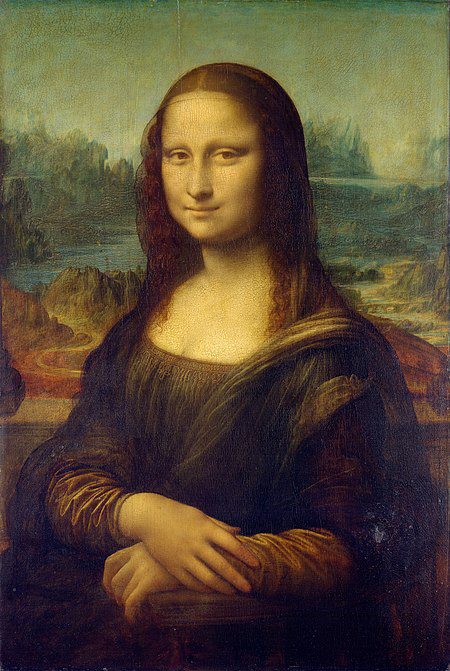

In [7]:
mona_lisa = Image.open("mona_lisa.jpg")
mona_lisa

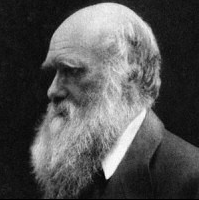

In [8]:
darwin = Image.open("darwin.png").convert("RGB")
darwin

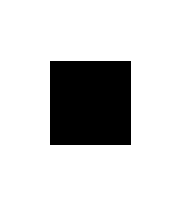

In [9]:
square = Image.open("square.png").convert("RGB")
square

In [10]:
orig_mat = np.array(mona_lisa)
print(orig_mat.shape)
cost_poly(polygons_array, orig_mat, 50)

(671, 450, 3)


32857808075

In [11]:
orig_mat = np.array(darwin)
cost_poly(polygons_array, orig_mat, 50)

4177685205

In [12]:
20676969/(200*199*3*255)

0.6791135087200709

In [13]:
orig_square = np.array(square)
print(orig_square.shape)

(208, 187, 3)


### Hill-climbing/ Simulated Annealing

In [18]:
from random import randint, choice, random

In [19]:
# Generate new population randomly based on the bounds
    # bounds - bounds for each parameter of polygon
    # popsize - population size
    # nr_poly - number of polygons
    # nr_vertex - number of vertices

def popul_from_bounds(bounds, popsize, nr_poly, nr_vertex):
    
    population = []
    
    nr_params = 4 + 2*nr_vertex  # 4 - RGBA and then X,Y for vertices
    
    for i in range(0, popsize):
        indv = []

        for j in range(nr_poly):
            polygons = []
            for k in range(nr_params):
                polygons.append(randint(bounds[k][0],bounds[k][1]))
            indv.append(polygons)
        population.append(indv)
        
    return population

In [20]:
popul_from_bounds(bounds=bounds, popsize=1, nr_poly=nr_poly, nr_vertex=nr_vertex)

[[[34, 65, 243, 151, 163, 19, 64, 35, 101, 30],
  [154, 197, 64, 16, 158, 85, 52, 95, 58, 151],
  [96, 65, 241, 55, 108, 10, 128, 1, 160, 102],
  [226, 7, 211, 50, 100, 185, 135, 119, 73, 103],
  [238, 87, 73, 163, 86, 62, 187, 70, 141, 124]]]

In [31]:
def show_img(size, dna, nr_poly):
    new_img = gen_image_poly(size, np.split(dna, nr_poly))
    plt.imshow(new_img)
    plt.show()


In [23]:
randint(bounds[2][0], bounds[2][1])

194

In [32]:
def hill(orig_img, nr_poly, nr_vertex, iter = 10, mut_rate = 0.05, mut_change = 0.05, mut_random = False):
    
    # Get params
    size = tuple(reversed(orig_img.shape[:2])) # W and H of image
    bounds = get_bounds(nr_poly, nr_vertex, size)
    # Init DNA
    dna = popul_from_bounds(bounds, popsize=1, nr_poly=nr_poly, nr_vertex=nr_vertex)[0]  # Only one element in pop, take 1st
    dna = np.array(dna).flatten()
    #print(dna)
    
    cost_last = cost_poly(nr_poly=nr_poly, orig_mat=orig_img, params=dna)
        
    len_dna = len(dna)
    dna_last = dna
    dna_new = dna_last.copy()
    
    impr = 0
    
    for i in range(iter):    
        
        # Select randomly param to change and change it by mutation rate
        idx = randint(0, len_dna - 1)
        direction = choice([-1,1])  # Select randomly the direction
        limits = bounds[idx]  # limits 
        
        if mut_random:
            dna_new[idx] = randint(limits[0], limits[1])
        else:
            #Mutate
            dna_new[idx] = dna_last[idx] + direction*limits[1]*mut_rate
        
        # Quick limits check
        if dna_new[idx] > limits[1]:
            dna_new[idx] = limits[1]
        elif dna_new[idx] < limits[0]:
            dna_new[idx] = limits[0]
        
        # Calculate new cost
        cost_new = cost_poly(nr_poly=nr_poly, orig_mat=orig_img, params=dna_new)
        
        mut = random()
        
        # Compare costs
        if (mut < mut_change)  or (cost_new < cost_last):
            dna_last = dna_new.copy()
            cost_last = cost_new
            impr += 1
        else:
            dna_new = dna_last.copy()
            
        if i % 1000 == 0:
            print("Iteration", i)
            print("improvements", impr)
            fit = cost_last/(255*255*3*size[0]*size[1])
            print("Fitness: ", 1-fit)
            show_img(size, dna_last, nr_poly)
        
    
    show_img(size, dna_last, nr_poly)
    return dna_last

Atm works only with 5 polygons for some reason.

Iteration 0
improvements 0


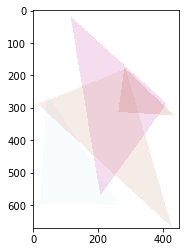

Iteration 1000
improvements 361


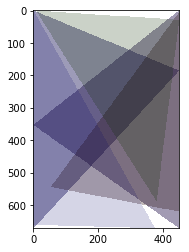

Iteration 2000
improvements 522


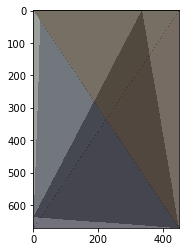

Iteration 3000
improvements 606


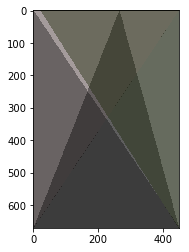

Iteration 4000
improvements 691


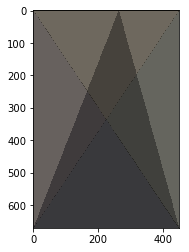

Iteration 5000
improvements 782


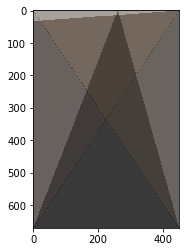

Iteration 6000
improvements 881


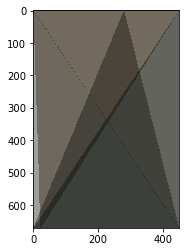

Iteration 7000
improvements 990


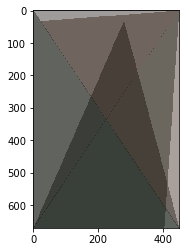

Iteration 8000
improvements 1097


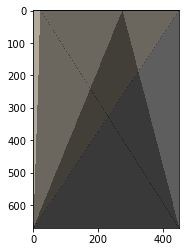

Iteration 9000
improvements 1204


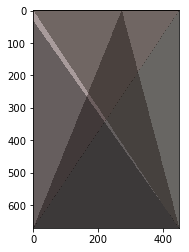

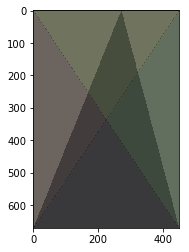

array([ 56,  22,   0, 100,   1, 671, 450,   1,   1,   1,   0,   0,   0,
       100, 449, 671, 450,   1,   1, 671,   0,   0,  12, 100,   1, 670,
       272,   1, 450, 671,  10,  41,   0, 100, 450, 671,   1,   1, 449,
         1,   0,   0,   0, 100,   1,   1, 450, 671,   1, 671])

In [80]:
hill(orig_mat, 5, 3, 10000, mut_rate=0.05)

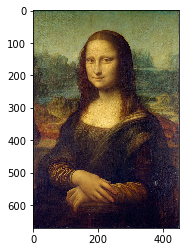

In [83]:
plt.imshow(orig_mat)
plt.show()

Iteration 0
improvements 0


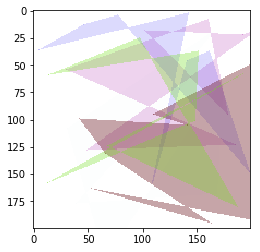

Iteration 1000
improvements 399


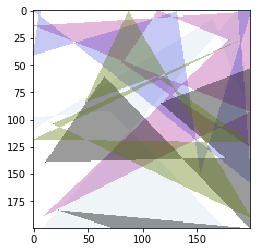

Iteration 2000
improvements 682


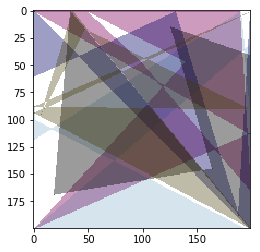

Iteration 3000
improvements 871


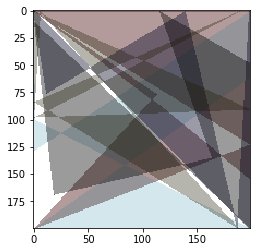

Iteration 4000
improvements 1013


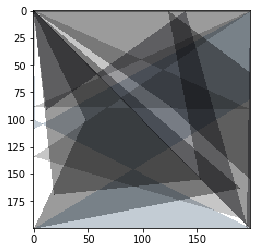

Iteration 5000
improvements 1117


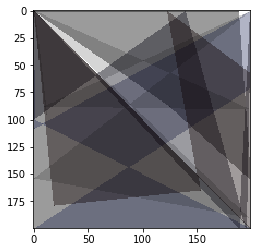

Iteration 6000
improvements 1227


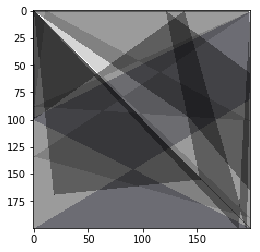

Iteration 7000
improvements 1333


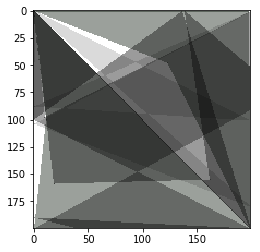

Iteration 8000
improvements 1419


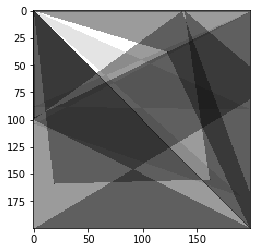

Iteration 9000
improvements 1505


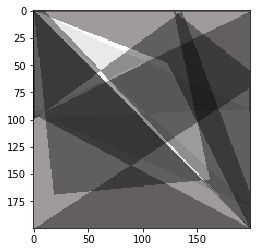

Iteration 10000
improvements 1595


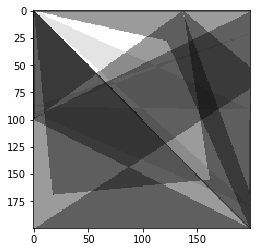

Iteration 11000
improvements 1666


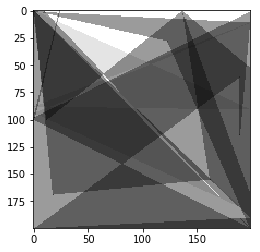

Iteration 12000
improvements 1753


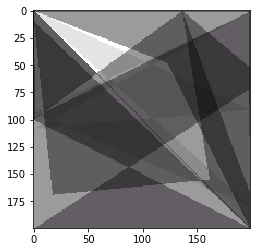

Iteration 13000
improvements 1866


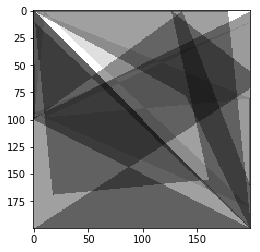

Iteration 14000
improvements 1976


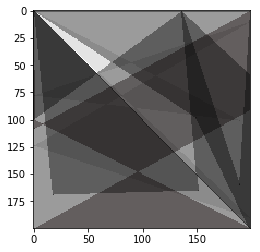

Iteration 15000
improvements 2055


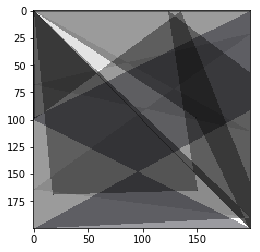

Iteration 16000
improvements 2170


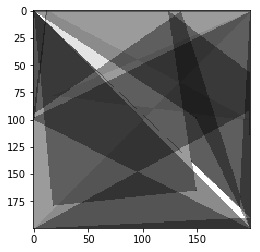

Iteration 17000
improvements 2248


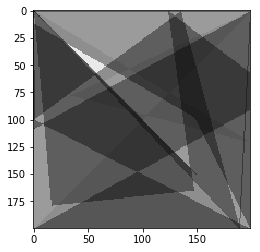

Iteration 18000
improvements 2354


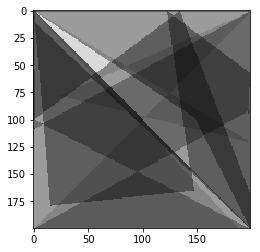

Iteration 19000
improvements 2449


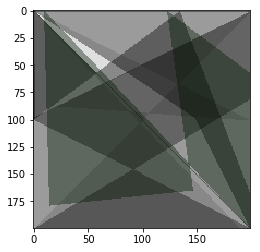

Iteration 20000
improvements 2544


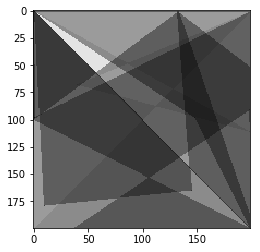

Iteration 21000
improvements 2621


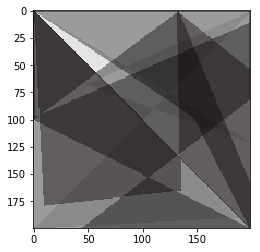

Iteration 22000
improvements 2748


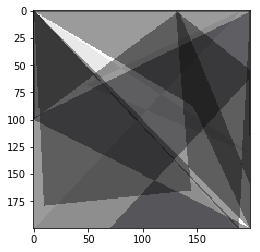

Iteration 23000
improvements 2845


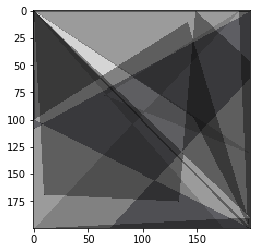

Iteration 24000
improvements 2942


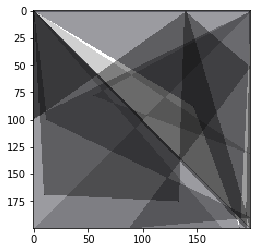

Iteration 25000
improvements 3026


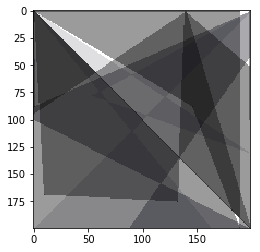

Iteration 26000
improvements 3137


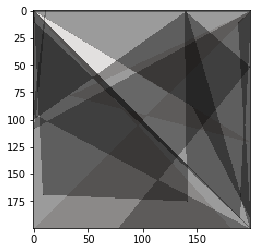

Iteration 27000
improvements 3256


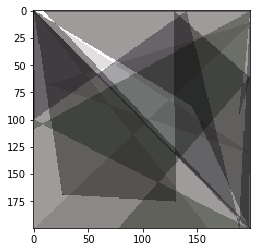

Iteration 28000
improvements 3348


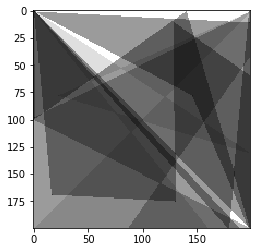

Iteration 29000
improvements 3448


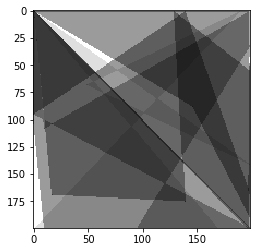

Iteration 30000
improvements 3547


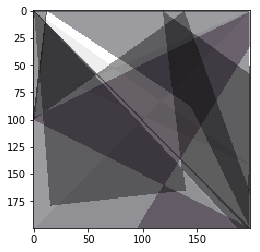

Iteration 31000
improvements 3646


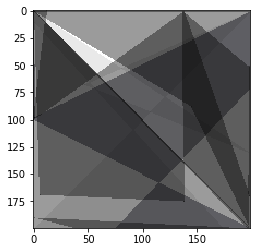

Iteration 32000
improvements 3723


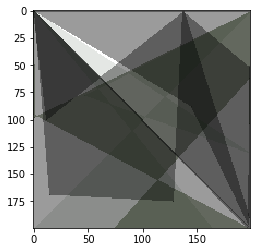

Iteration 33000
improvements 3825


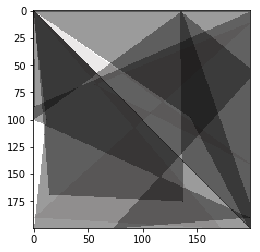

Iteration 34000
improvements 3928


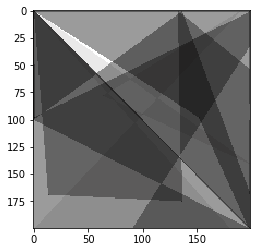

Iteration 35000
improvements 4025


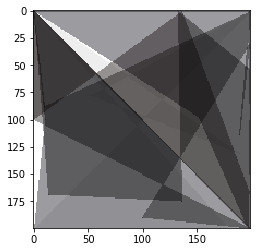

Iteration 36000
improvements 4099


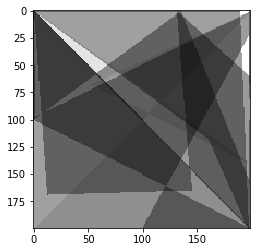

Iteration 37000
improvements 4200


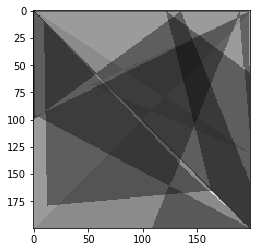

Iteration 38000
improvements 4318


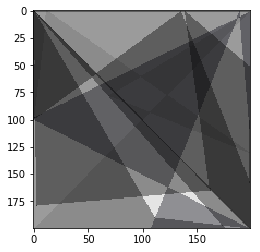

Iteration 39000
improvements 4405


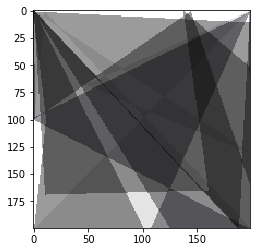

Iteration 40000
improvements 4513


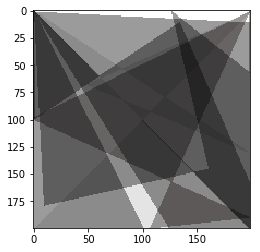

Iteration 41000
improvements 4615


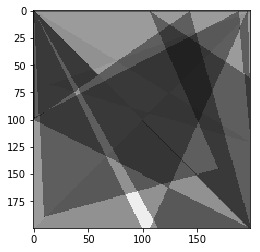

Iteration 42000
improvements 4694


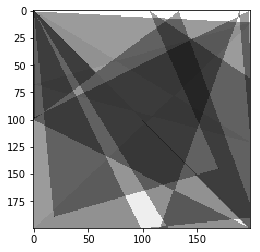

Iteration 43000
improvements 4790


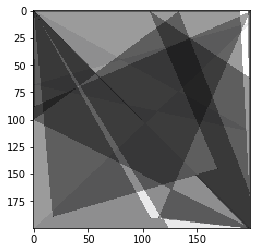

Iteration 44000
improvements 4881


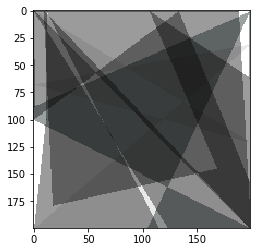

Iteration 45000
improvements 4988


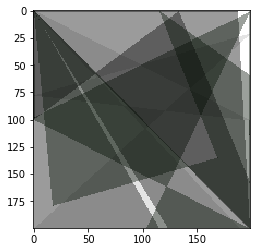

Iteration 46000
improvements 5103


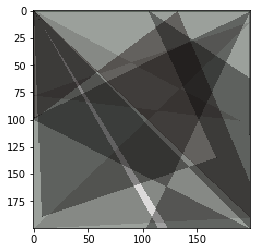

Iteration 47000
improvements 5208


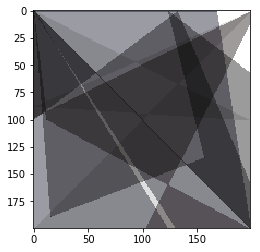

Iteration 48000
improvements 5312


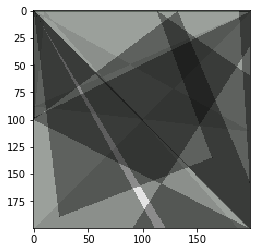

Iteration 49000
improvements 5429


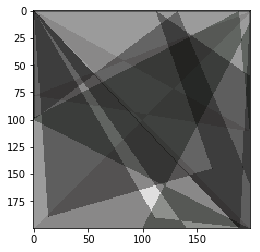

Iteration 50000
improvements 5537


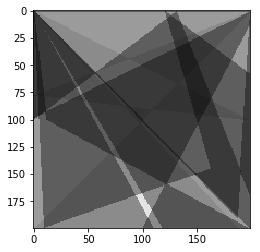

Iteration 51000
improvements 5643


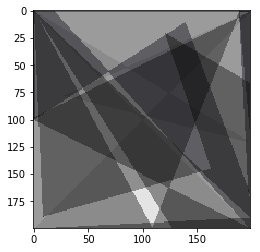

Iteration 52000
improvements 5761


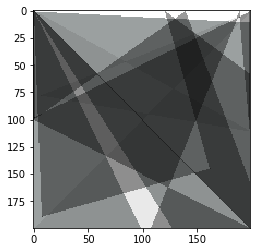

Iteration 53000
improvements 5847


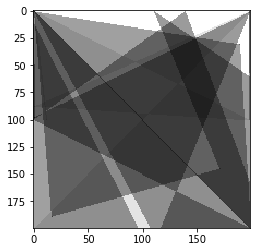

Iteration 54000
improvements 5963


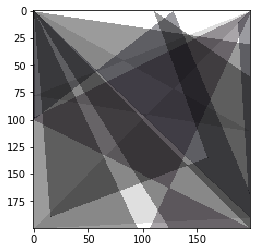

Iteration 55000
improvements 6052


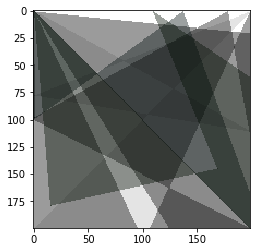

Iteration 56000
improvements 6119


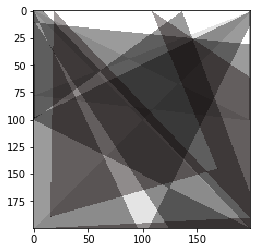

Iteration 57000
improvements 6206


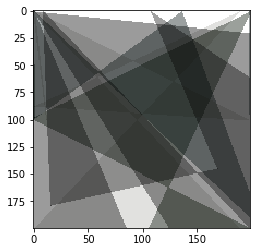

Iteration 58000
improvements 6329


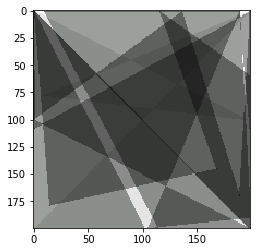

Iteration 59000
improvements 6438


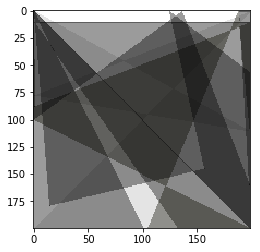

Iteration 60000
improvements 6525


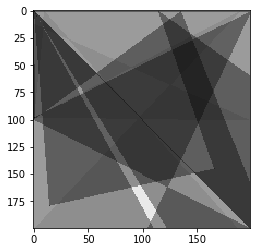

Iteration 61000
improvements 6619


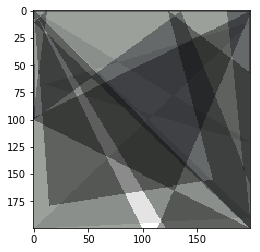

Iteration 62000
improvements 6733


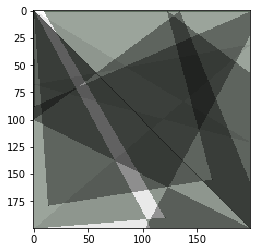

Iteration 63000
improvements 6823


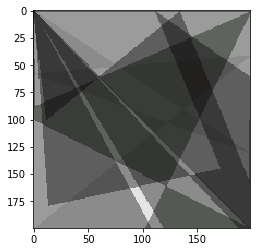

Iteration 64000
improvements 6913


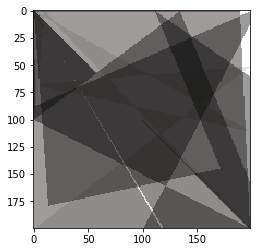

Iteration 65000
improvements 7000


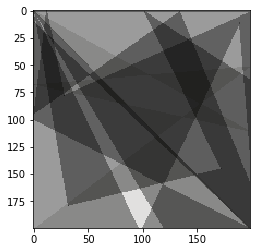

Iteration 66000
improvements 7104


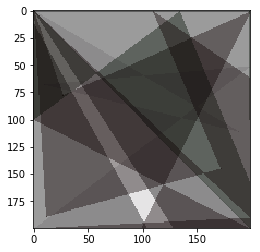

Iteration 67000
improvements 7213


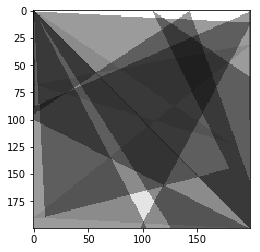

Iteration 68000
improvements 7290


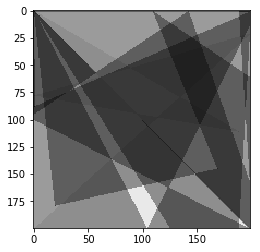

Iteration 69000
improvements 7376


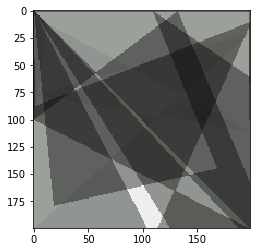

Iteration 70000
improvements 7506


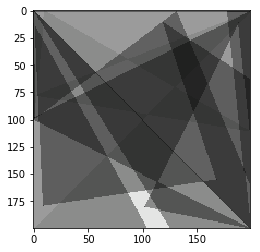

Iteration 71000
improvements 7583


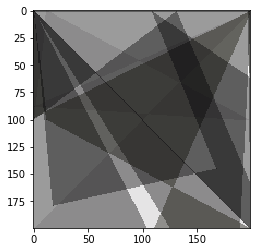

Iteration 72000
improvements 7669


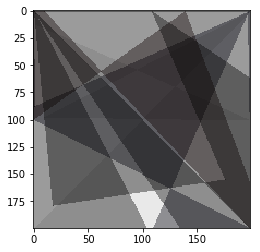

Iteration 73000
improvements 7748


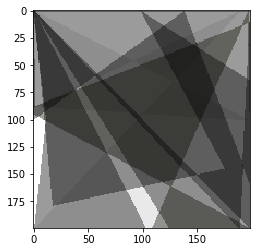

Iteration 74000
improvements 7851


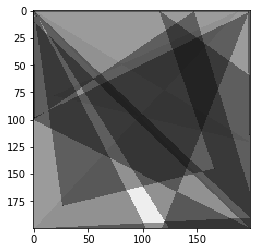

Iteration 75000
improvements 7945


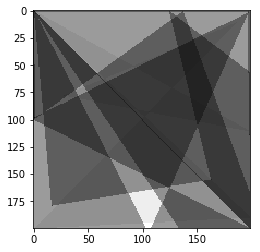

Iteration 76000
improvements 8047


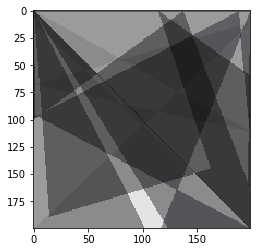

Iteration 77000
improvements 8126


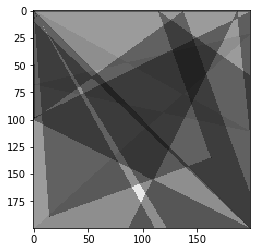

Iteration 78000
improvements 8223


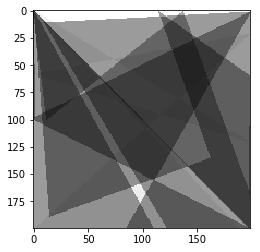

Iteration 79000
improvements 8324


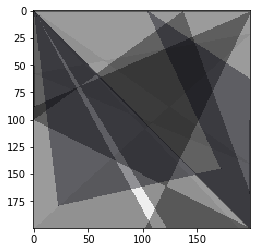

Iteration 80000
improvements 8383


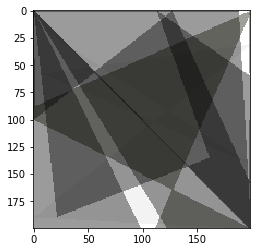

Iteration 81000
improvements 8483


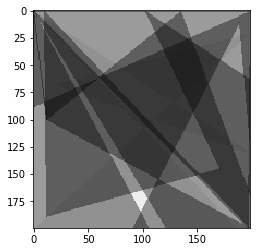

Iteration 82000
improvements 8577


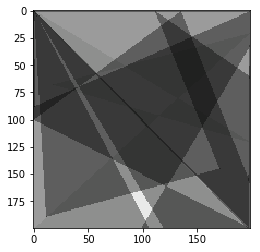

Iteration 83000
improvements 8663


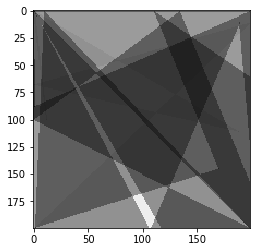

Iteration 84000
improvements 8742


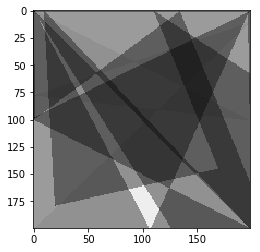

Iteration 85000
improvements 8825


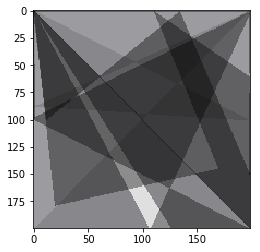

Iteration 86000
improvements 8911


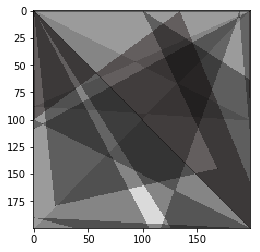

Iteration 87000
improvements 9026


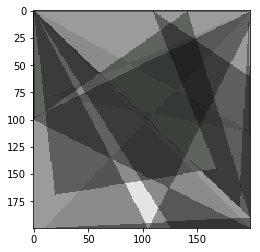

Iteration 88000
improvements 9105


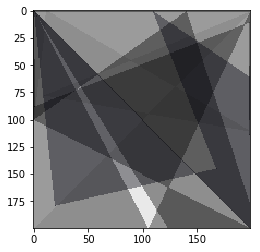

Iteration 89000
improvements 9201


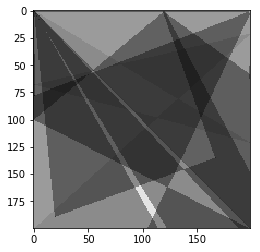

Iteration 90000
improvements 9322


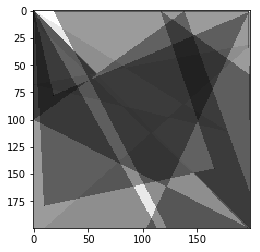

Iteration 91000
improvements 9437


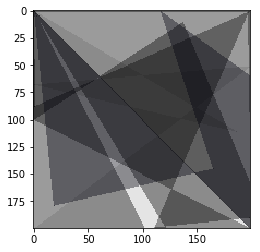

Iteration 92000
improvements 9525


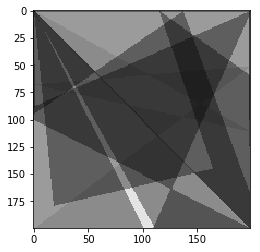

Iteration 93000
improvements 9615


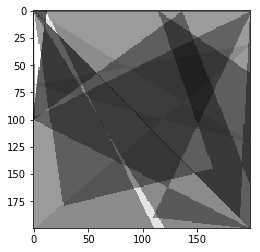

Iteration 94000
improvements 9712


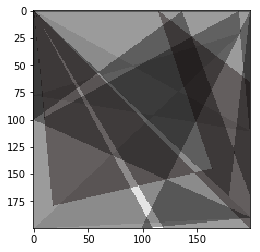

Iteration 95000
improvements 9821


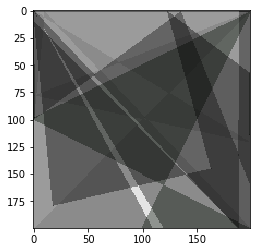

Iteration 96000
improvements 9917


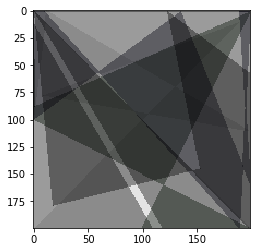

Iteration 97000
improvements 10043


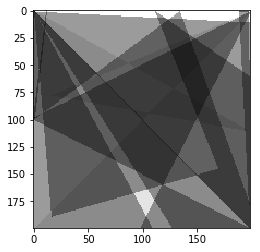

Iteration 98000
improvements 10133


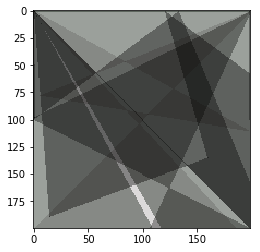

Iteration 99000
improvements 10224


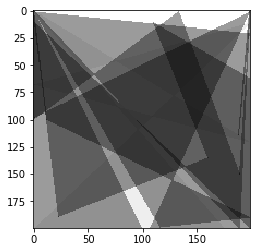

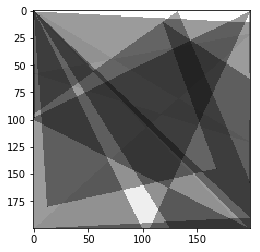

array([  0,   0,   0, 100, 199,  11, 199, 200,  99, 200,   0,   0,   0,
        95,   1, 200, 126, 200,   1,   1,   0,   0,   0, 100, 199, 114,
       198,   1,   1,  98,   0,   0,   0, 100, 198, 200, 107, 200, 198,
         1,   0,   0,   0,  90, 199,   1, 198, 200,   1,   1,   0,   0,
         0,  95, 132,   1, 199, 160, 199,   1,   0,   0,   0, 100,   1,
         1, 199, 190,   1, 200, 255, 255, 255, 100, 119,  11, 168, 145,
        13, 180,   0,   0,   0,  17, 199,  21,   1,  58, 199, 121,   0,
         0,   0, 100,   1,   1, 193, 200,   1, 200])

In [88]:
orig_mat = np.array(darwin)
hill(orig_mat, 10, 3, 100000, mut_rate=0.05)

Iteration 0
improvements 0
Fitness:  0.727154362998


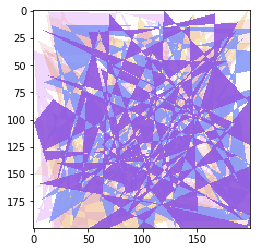

Iteration 1000
improvements 504
Fitness:  0.801676209575


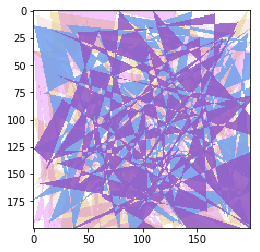

Iteration 2000
improvements 956
Fitness:  0.855018288804


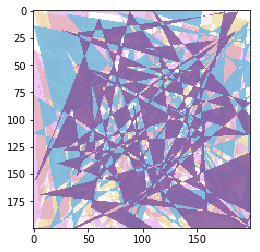

Iteration 3000
improvements 1377
Fitness:  0.895556098318


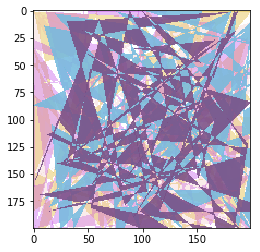

Iteration 4000
improvements 1773
Fitness:  0.921461375054


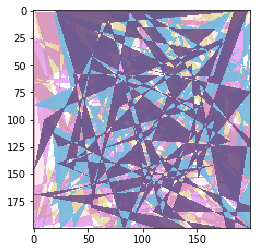

Iteration 5000
improvements 2147
Fitness:  0.942105082506


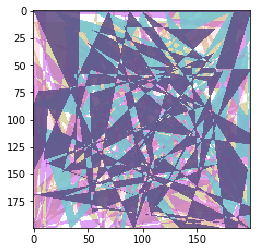

Iteration 6000
improvements 2475
Fitness:  0.952851185184


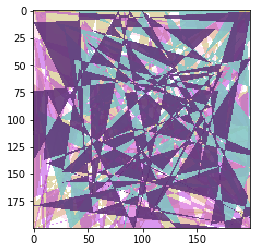

Iteration 7000
improvements 2799
Fitness:  0.963352760728


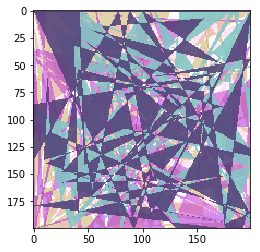

Iteration 8000
improvements 3106
Fitness:  0.968327564131


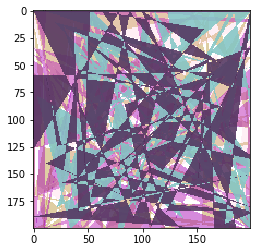

Iteration 9000
improvements 3405
Fitness:  0.970953879097


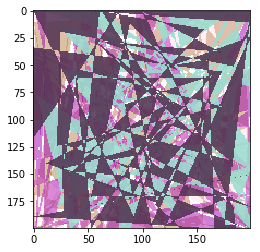

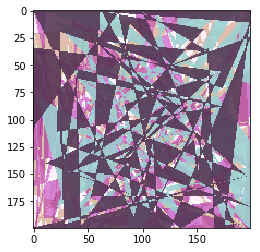

array([170, 118,  48, 113, 199, 118, 199, 200,  10, 181, 189,  62, 145,
         1, 166,  65, 128,   0,  12, 108,  28, 123,  67, 190, 123,  66,
       189, 105, 165,  11,  80,  18,  28, 137, 107, 255,  77, 200, 199,
        22, 124,  48, 154,  62, 112, 133, 199, 165,  65,  12,  45, 255,
         1,  27,   1, 121,   1, 169, 107, 200,  94,  14, 199, 153,   0,
        86,  12, 255,  38,   1,  23, 190,   1, 185,  19, 200, 110, 144,
       160,   1, 155, 196,   0, 212, 192, 200,  89, 188, 169,   1, 134,
         1,  92,  62,   1, 200,  35,  12,  12, 255, 199, 200,  72, 121,
       199, 105,  10, 200,   1,  68, 120, 200, 114, 109, 211, 116,  49,
       159,  91,  18, 189, 179, 143, 180, 112,  51, 114, 175, 214, 196,
         0, 226, 163,   1,   1,  21,  23, 111, 199,   1, 116, 200,  61,
        76,  38, 184, 195,  60, 196, 101, 198, 176,  38, 103, 121,  95,
       152,  79,  73,  93, 164,   0, 166, 129, 110, 166, 176, 136,  10,
        37,  10, 190, 119, 200,  35,  79,  81,  93,  13, 255, 19

In [303]:
hill(orig_mat, 50, 6, 10000, mut_rate=0.05)

Iteration 0
improvements 1
Fit:  106.014451736


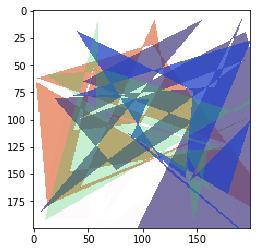

Iteration 1000
improvements 255
Fit:  23.6183070582


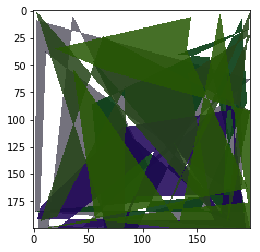

Iteration 2000
improvements 416
Fit:  16.2177130095


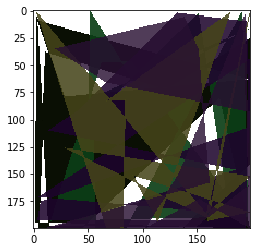

Iteration 3000
improvements 524
Fit:  13.276046507


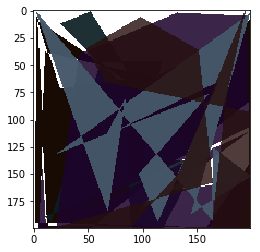

Iteration 4000
improvements 600
Fit:  12.037167537


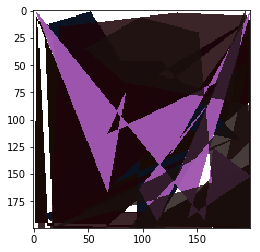

Iteration 5000
improvements 658
Fit:  11.366195323


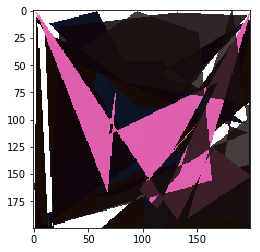

Iteration 6000
improvements 714
Fit:  10.5556783591


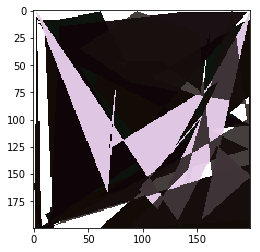

Iteration 7000
improvements 748
Fit:  9.80679439682


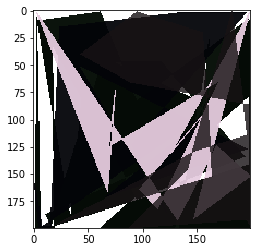

Iteration 8000
improvements 779
Fit:  9.38977896016


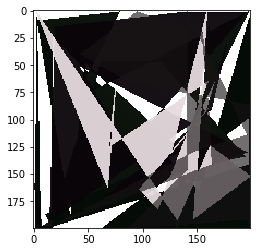

Iteration 9000
improvements 814
Fit:  8.76636161198


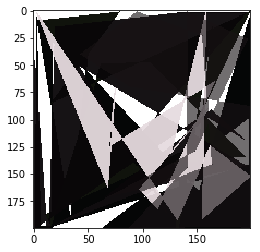

Iteration 10000
improvements 851
Fit:  7.43055003777


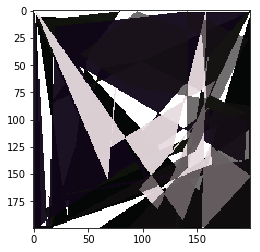

Iteration 11000
improvements 888
Fit:  7.16306568792


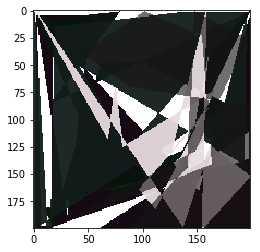

Iteration 12000
improvements 902
Fit:  7.13076539561


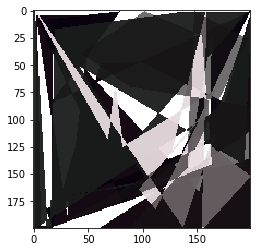

Iteration 13000
improvements 921
Fit:  6.97561414918


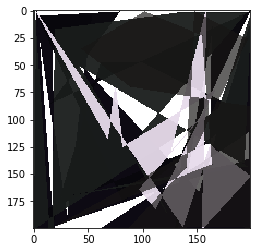

Iteration 14000
improvements 932
Fit:  6.35936085657


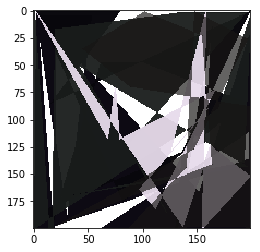

Iteration 15000
improvements 951
Fit:  6.03251193878


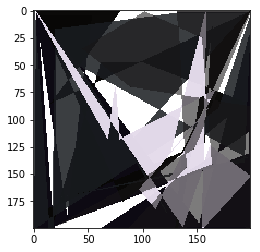

Iteration 16000
improvements 962
Fit:  5.99998742076


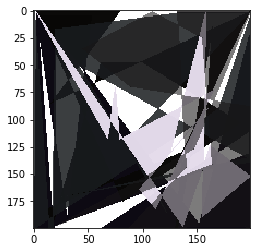

Iteration 17000
improvements 975
Fit:  5.95265050744


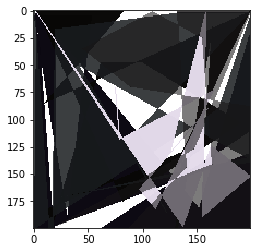

Iteration 18000
improvements 981
Fit:  5.94569783558


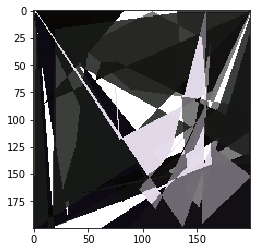

Iteration 19000
improvements 996
Fit:  5.85181558117


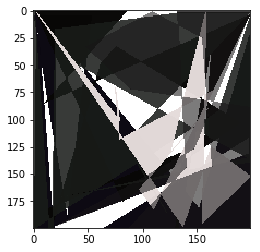

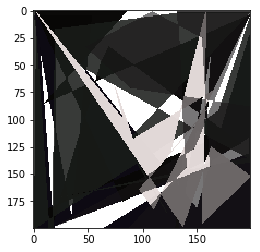

array([ 11,   8,  17, 253,   1,   6,   3,   1,  18, 198, 198, 131, 198,
        23, 150, 182,  20,  20,  19, 228, 198, 116, 198, 199,   1, 200,
         3,   5,  53,   5,  35, 192,   8,   7,   6, 252, 190, 122,  82,
       175,   2,   1,  85,   1,  10,  85, 198,   4, 137, 129, 128, 224,
       164,  29, 157, 121,  13, 182,  17, 198,  62,  48,  69,  33,  25,
        28,  25, 221, 196, 135,  41,  50, 122, 185,  85, 121, 198,   2,
       132,   2,  20,  17,  17, 241,   1,   1,   1, 200, 170,  92, 199,
         5, 198, 139,  26, 171, 228, 219, 218, 250, 125, 131, 160,  90,
        97, 164, 110, 182, 165,  73,  91, 118,  75,  71,  83, 101,   3,
         2, 137, 198, 163, 125, 199, 152, 155, 195, 158,   2,  23,  21,
        22, 149, 147, 127, 199,   1, 132,   1, 140, 144,  87, 200, 194,
       200, 237, 248, 243,  95,  89,  71,  48,  33, 109,   1, 155,  25,
       162, 143,  22, 197])

In [296]:
hill(orig_mat, 10, 6, 20000, mut_random = True, mut_change = 0.0)

Iteration 0
improvements 0
Fitness:  0.633148750416


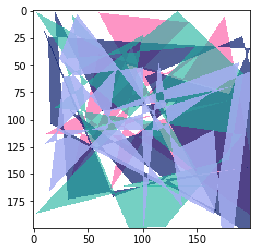

Iteration 1000
improvements 270
Fitness:  0.879717329438


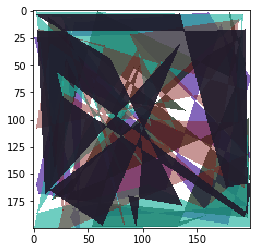

Iteration 2000
improvements 466
Fitness:  0.941451909039


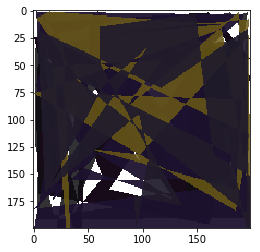

Iteration 3000
improvements 592
Fitness:  0.957807459829


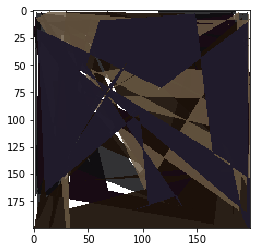

Iteration 4000
improvements 708
Fitness:  0.965586887017


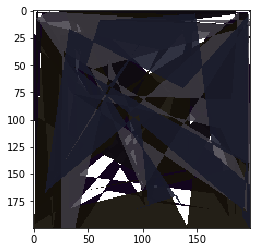

Iteration 5000
improvements 781
Fitness:  0.968611235725


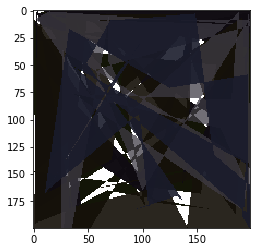

Iteration 6000
improvements 842
Fitness:  0.970001439596


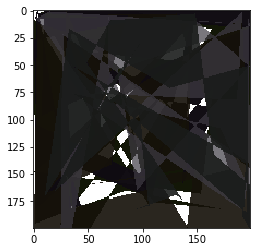

Iteration 7000
improvements 914
Fitness:  0.97204006847


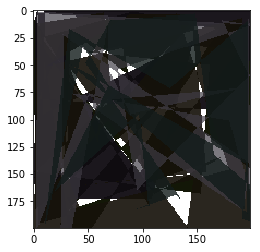

Iteration 8000
improvements 943
Fitness:  0.972635766684


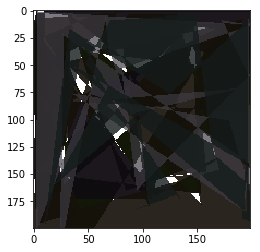

Iteration 9000
improvements 970
Fitness:  0.973136522031


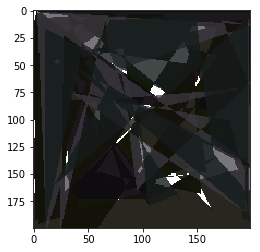

Iteration 10000
improvements 999
Fitness:  0.9742423007


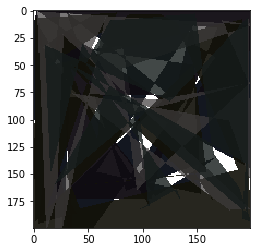

Iteration 11000
improvements 1034
Fitness:  0.974948128055


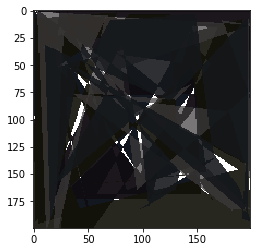

Iteration 12000
improvements 1071
Fitness:  0.975923590914


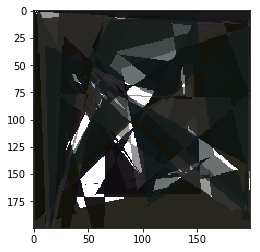

Iteration 13000
improvements 1103
Fitness:  0.976476137061


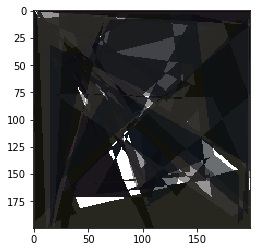

Iteration 14000
improvements 1139
Fitness:  0.976874807203


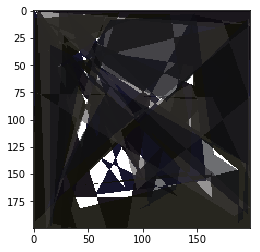

Iteration 15000
improvements 1161
Fitness:  0.977241876305


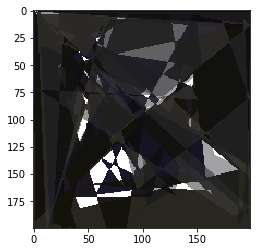

Iteration 16000
improvements 1174
Fitness:  0.977326295581


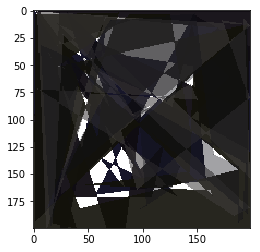

Iteration 17000
improvements 1193
Fitness:  0.977623615579


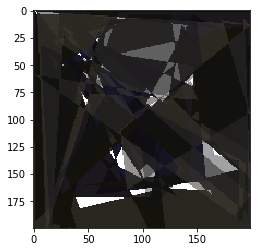

Iteration 18000
improvements 1212
Fitness:  0.977856197816


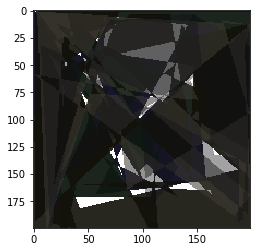

Iteration 19000
improvements 1237
Fitness:  0.978040523005


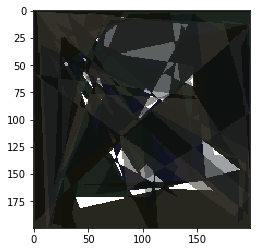

Iteration 20000
improvements 1258
Fitness:  0.978266225656


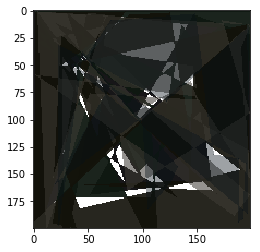

Iteration 21000
improvements 1282
Fitness:  0.978419862223


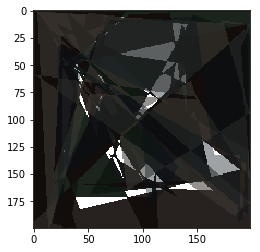

Iteration 22000
improvements 1294
Fitness:  0.978583961458


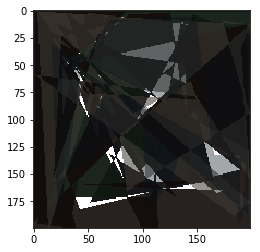

Iteration 23000
improvements 1309
Fitness:  0.978706776739


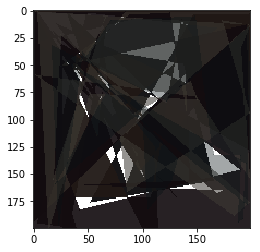

Iteration 24000
improvements 1339
Fitness:  0.978860132393


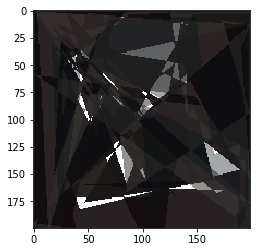

Iteration 25000
improvements 1357
Fitness:  0.978997562463


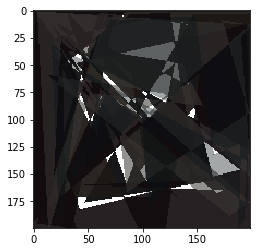

Iteration 26000
improvements 1372
Fitness:  0.979140180333


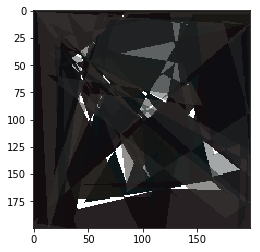

Iteration 27000
improvements 1384
Fitness:  0.979354003131


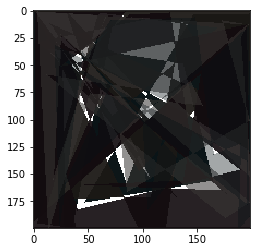

Iteration 28000
improvements 1398
Fitness:  0.979394650943


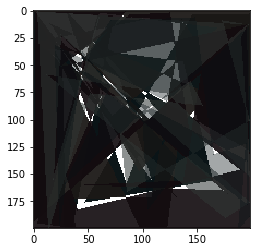

Iteration 29000
improvements 1420
Fitness:  0.979541728893


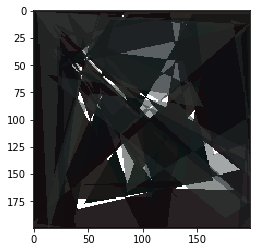

Iteration 30000
improvements 1431
Fitness:  0.979641724321


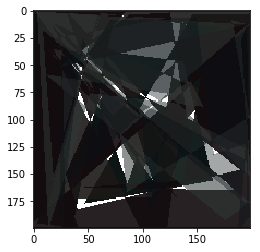

Iteration 31000
improvements 1444
Fitness:  0.979766741306


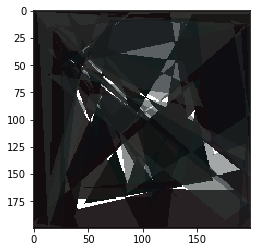

Iteration 32000
improvements 1454
Fitness:  0.979822922636


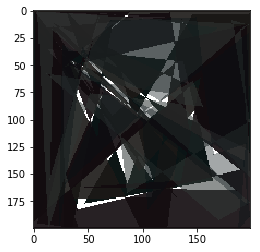

Iteration 33000
improvements 1466
Fitness:  0.979904115606


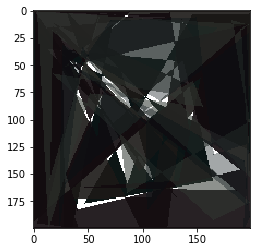

Iteration 34000
improvements 1478
Fitness:  0.98006080988


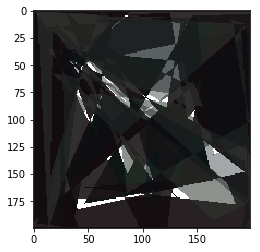

Iteration 35000
improvements 1491
Fitness:  0.980120592325


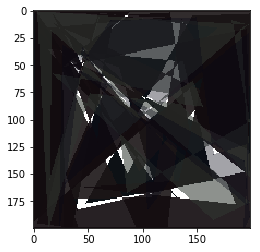

Iteration 36000
improvements 1500
Fitness:  0.980165790763


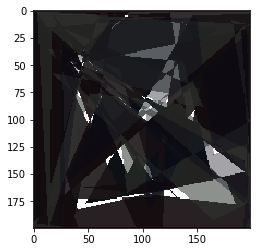

Iteration 37000
improvements 1512
Fitness:  0.980240689414


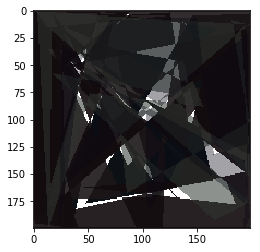

Iteration 38000
improvements 1520
Fitness:  0.980260604831


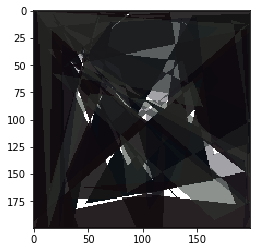

Iteration 39000
improvements 1524
Fitness:  0.980267078697


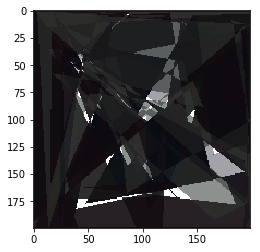

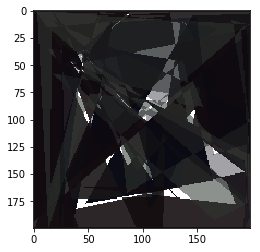

array([  7,   8,  17, 251, 111, 159,  79,  53,  75,  36, 138,  47, 164,
       156,  48, 177, 146,   5, 198,   3, 199, 167, 198, 132,  26,  41,
        29, 230,  72,  12,  41,  38,  12,  35, 131, 171,  96, 132,  86,
       143,  31,  20, 115,  93,   1, 193,   1,   1,  23,  21,  22, 230,
        31, 173,  41, 200,   2, 200,  60,   1, 169,  16,  72, 103,   2,
         1, 199,   1, 198,  93,  19,  10, 120, 125, 117, 246,   1,   1,
       121,   5,   2,  17,  96, 102,  18,   2,  95, 147, 171,  65, 150,
        31, 136,   8, 109, 171,  18,  11,  15, 227, 195,  17, 199, 199,
         1, 199,   2,   2,  88,   1,  47,  37,  11, 184, 156,  60, 134,
       162,  47, 162, 186, 178, 178, 158,  32,  47,  59, 121,  63,  75,
        30, 150,  37, 183, 194, 148, 142, 109, 125,   2,  88,   4,  26,
        52,  48,  54,  48, 140, 198, 102,  86, 167,  80, 114, 195,  14,
       190,  17, 199, 153, 125,  76,  18,  58, 166, 192, 198, 176,  16,
        17,  15, 164,  60,   6,  48,  51,  96,  94, 146,  65, 15

In [304]:
hill(orig_mat, 10, 10, 40000, mut_random = True, mut_change = 0.0)

Iteration 0
improvements 0
Fit:  0.367315108414


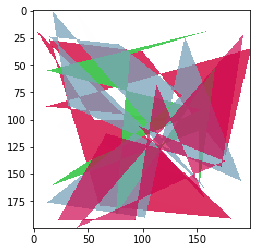

Iteration 1000
improvements 162
Fit:  0.147881698638


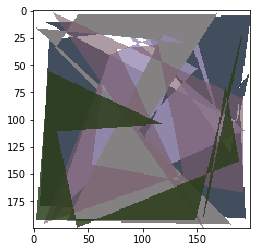

Iteration 2000
improvements 269
Fit:  0.0904820104624


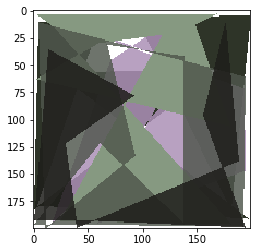

Iteration 3000
improvements 331
Fit:  0.0608342319054


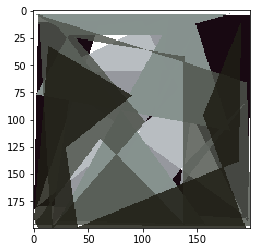

Iteration 4000
improvements 366
Fit:  0.0540826167232


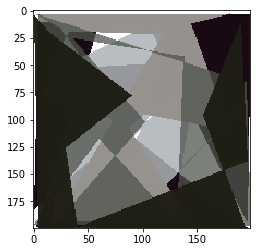

Iteration 5000
improvements 405
Fit:  0.0517795366683


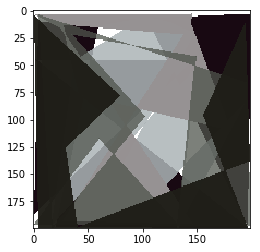

Iteration 6000
improvements 432
Fit:  0.0472517810119


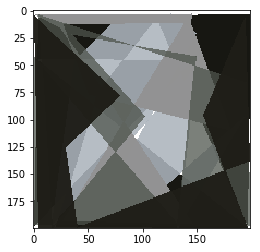

Iteration 7000
improvements 469
Fit:  0.0425842592432


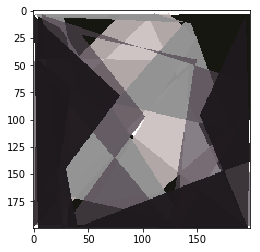

Iteration 8000
improvements 485
Fit:  0.041693496703


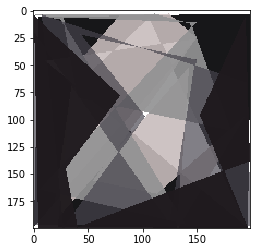

Iteration 9000
improvements 506
Fit:  0.0357076856795


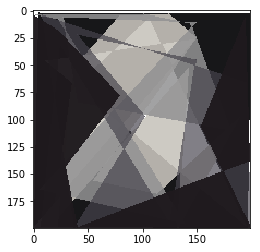

Iteration 10000
improvements 525
Fit:  0.0342673381002


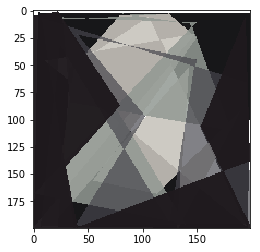

Iteration 11000
improvements 535
Fit:  0.0340690297573


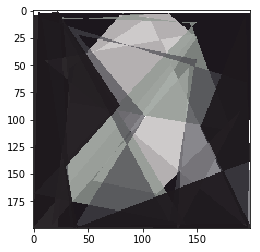

Iteration 12000
improvements 546
Fit:  0.033218622138


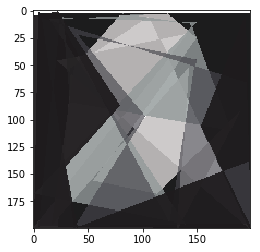

Iteration 13000
improvements 553
Fit:  0.0329936839136


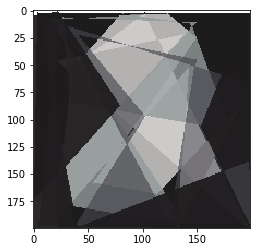

Iteration 14000
improvements 564
Fit:  0.0323589298537


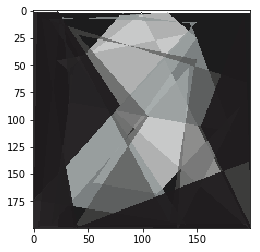

Iteration 15000
improvements 575
Fit:  0.0321791652096


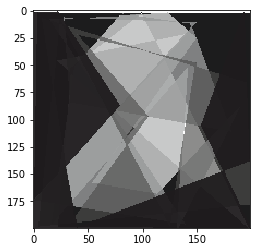

Iteration 16000
improvements 587
Fit:  0.0320340845584


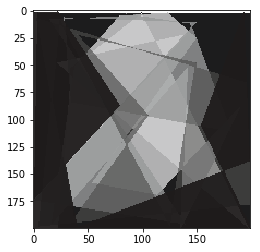

Iteration 17000
improvements 598
Fit:  0.031940411142


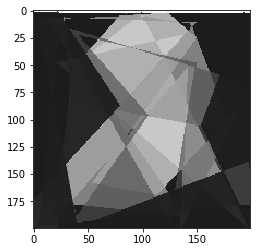

Iteration 18000
improvements 611
Fit:  0.0245331002056


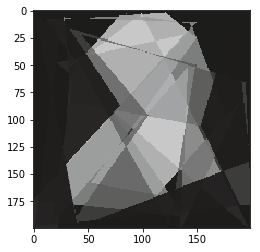

Iteration 19000
improvements 620
Fit:  0.0244864553448


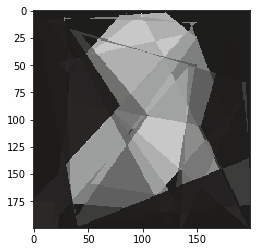

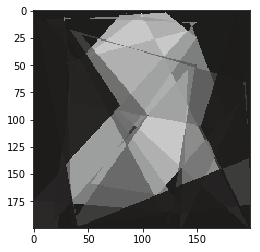

array([ 28,  28,  27, 254,  33,  53,  99,   2, 198, 200, 199,   1,   1,
         1,   1, 173, 142,  18,  29,  48, 197, 200,  23, 200, 194, 193,
       194, 228,  53, 159, 149,  25, 121,   2,  79,   5,  38,  51,  17,
       195, 141,  55, 135, 200, 189,  84, 113, 169, 151, 153, 153, 201,
         1, 174, 139, 186,  12,   8, 101,   4,  85,   3, 144,  12, 182,
       111,  35,  84,  28,   6, 149,  11,  77,  77,  76, 165,  35, 198,
        28,  16, 125, 197, 149,  50,  43,  22, 105,  96,  39, 190,   3,
         8, 194,  66, 199, 178,  30,  27,  27, 240,  29, 141,  79,  87,
        22,   1,   1,   2,   1, 200, 199, 200, 154, 106, 187,   2, 198,
       135,  40, 199])

In [291]:
hill(orig_mat, 5, 10, 20000, mut_random=True, mut_change=-1)

Iteration 0
improvements 1
Fitness:  0.600818809542


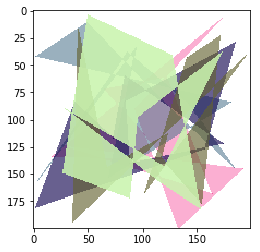

Iteration 1000
improvements 210
Fitness:  0.893507861234


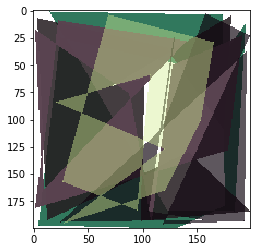

Iteration 2000
improvements 291
Fitness:  0.933731537992


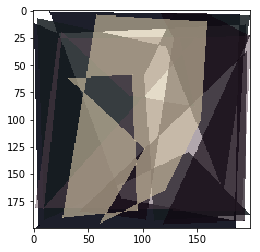

Iteration 3000
improvements 327
Fitness:  0.946059480409


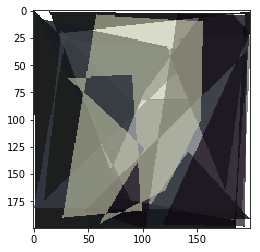

Iteration 4000
improvements 370
Fitness:  0.954967363152


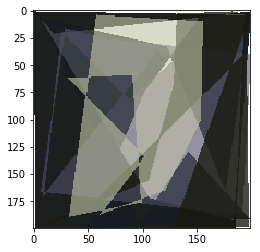

Iteration 5000
improvements 398
Fitness:  0.960729138194


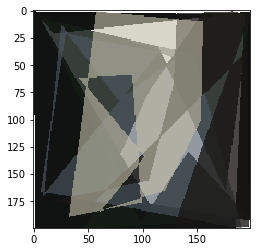

Iteration 6000
improvements 423
Fitness:  0.96234331326


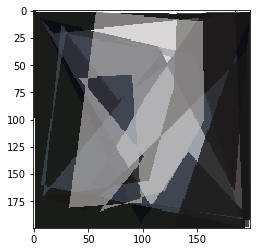

Iteration 7000
improvements 450
Fitness:  0.963447582395


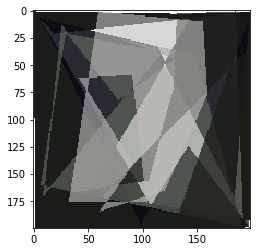

Iteration 8000
improvements 468
Fitness:  0.964326924382


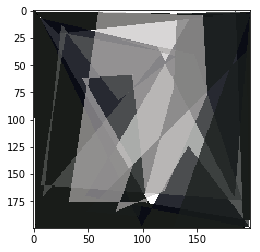

Iteration 9000
improvements 483
Fitness:  0.966853219449


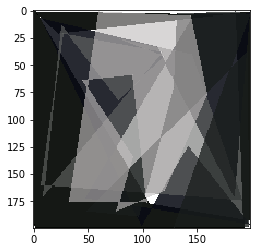

Iteration 10000
improvements 505
Fitness:  0.971459582418


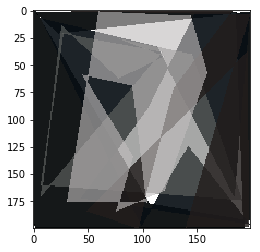

Iteration 11000
improvements 523
Fitness:  0.972656291711


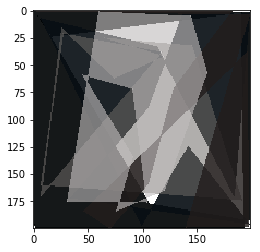

Iteration 12000
improvements 538
Fitness:  0.973453840264


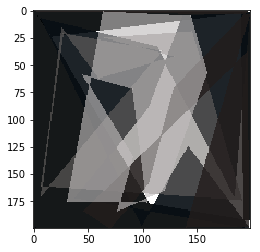

Iteration 13000
improvements 555
Fitness:  0.9737688969


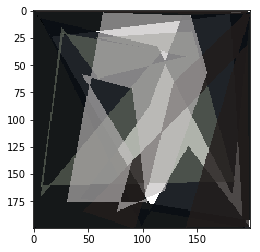

Iteration 14000
improvements 571
Fitness:  0.974086847927


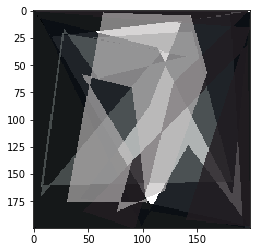

Iteration 15000
improvements 590
Fitness:  0.974638213108


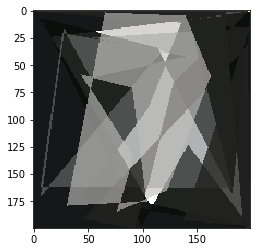

Iteration 16000
improvements 598
Fitness:  0.974892624857


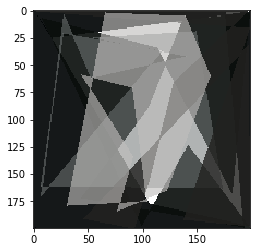

Iteration 17000
improvements 608
Fitness:  0.974978347202


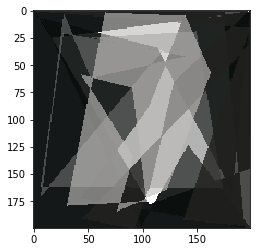

Iteration 18000
improvements 618
Fitness:  0.975064403267


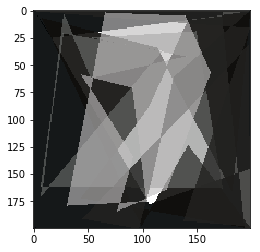

Iteration 19000
improvements 625
Fitness:  0.975114725235


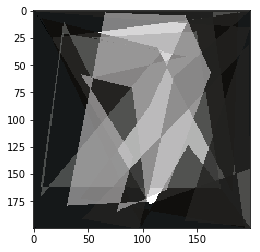

Iteration 20000
improvements 634
Fitness:  0.97518090478


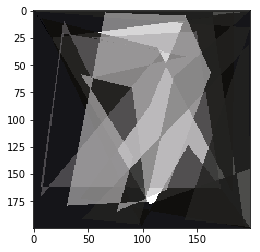

Iteration 21000
improvements 642
Fitness:  0.975253527538


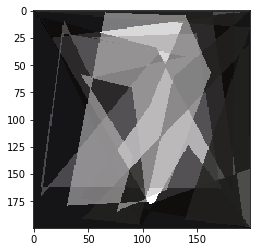

Iteration 22000
improvements 651
Fitness:  0.97536227002


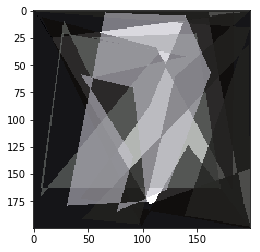

Iteration 23000
improvements 655
Fitness:  0.975410869805


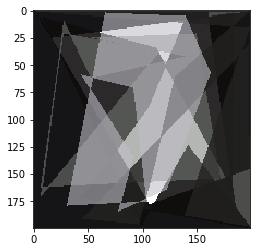

Iteration 24000
improvements 664
Fitness:  0.975496766673


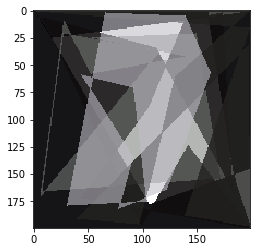

Iteration 25000
improvements 669
Fitness:  0.97554554871


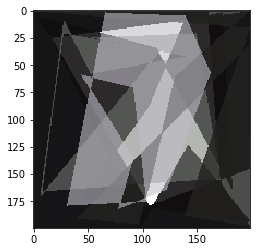

Iteration 26000
improvements 677
Fitness:  0.975615558634


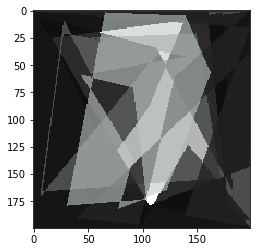

Iteration 27000
improvements 682
Fitness:  0.975641849385


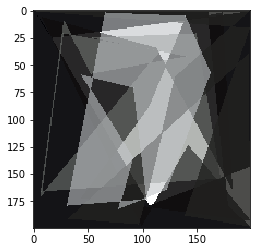

Iteration 28000
improvements 690
Fitness:  0.975674617996


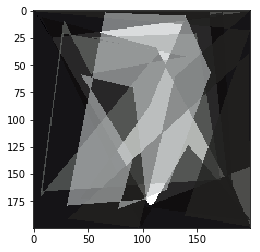

Iteration 29000
improvements 701
Fitness:  0.975756049503


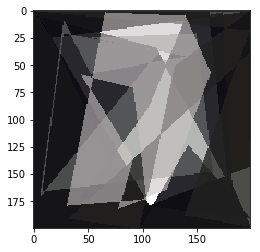

Iteration 30000
improvements 710
Fitness:  0.975801704151


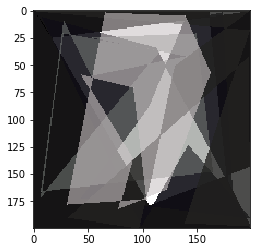

Iteration 31000
improvements 716
Fitness:  0.975820905115


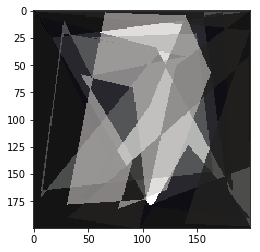

Iteration 32000
improvements 725
Fitness:  0.975919421405


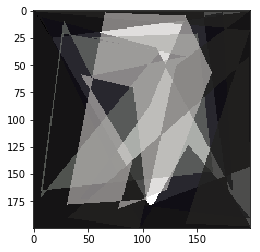

Iteration 33000
improvements 727
Fitness:  0.975930280777


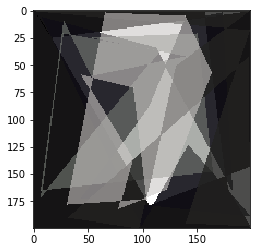

Iteration 34000
improvements 732
Fitness:  0.976007767403


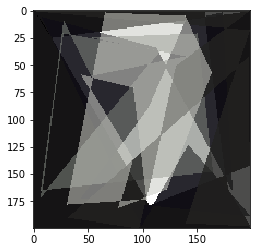

Iteration 35000
improvements 735
Fitness:  0.976021846513


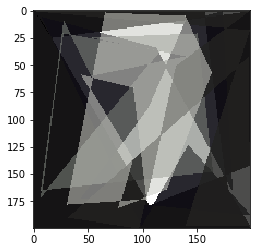

Iteration 36000
improvements 736
Fitness:  0.976065820581


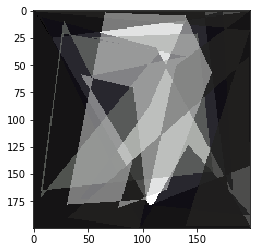

Iteration 37000
improvements 742
Fitness:  0.9761562248


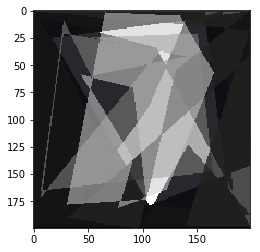

Iteration 38000
improvements 745
Fitness:  0.976162807502


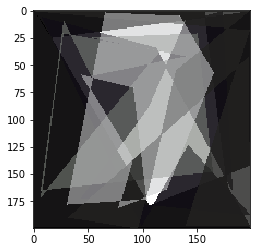

Iteration 39000
improvements 746
Fitness:  0.976163302093


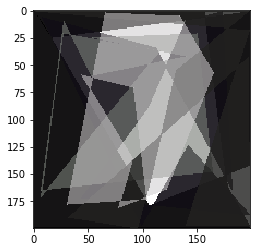

Iteration 40000
improvements 749
Fitness:  0.976193975645


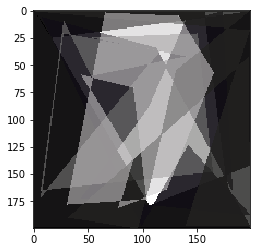

Iteration 41000
improvements 752
Fitness:  0.976247879021


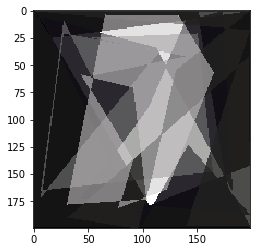

Iteration 42000
improvements 756
Fitness:  0.976260761581


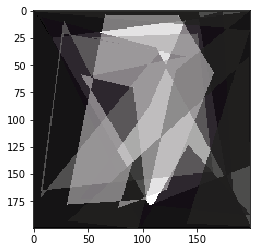

Iteration 43000
improvements 762
Fitness:  0.976300007406


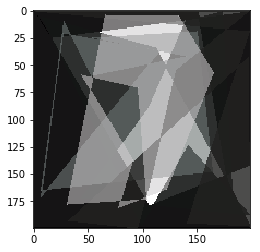

Iteration 44000
improvements 769
Fitness:  0.976492383744


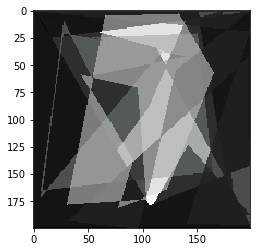

Iteration 45000
improvements 771
Fitness:  0.9764953075


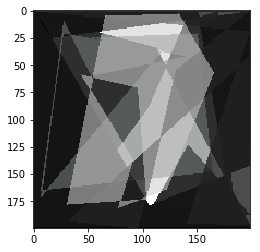

Iteration 46000
improvements 773
Fitness:  0.976506724704


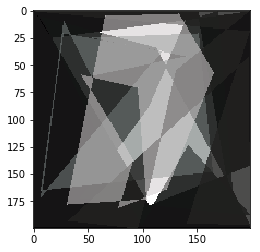

Iteration 47000
improvements 775
Fitness:  0.976508817444


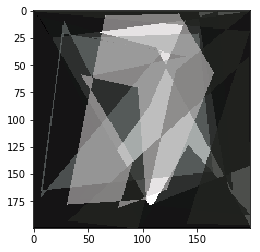

Iteration 48000
improvements 776
Fitness:  0.976509625019


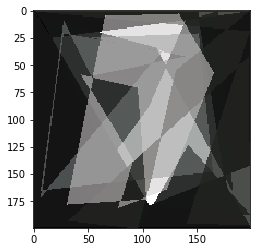

Iteration 49000
improvements 778
Fitness:  0.976519961849


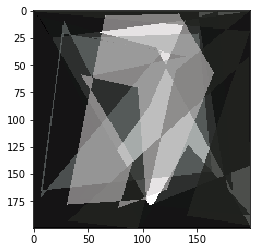

Iteration 50000
improvements 780
Fitness:  0.976522363194


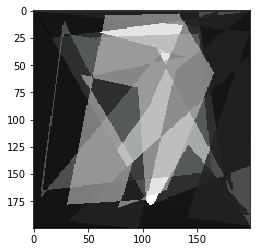

Iteration 51000
improvements 781
Fitness:  0.976532640777


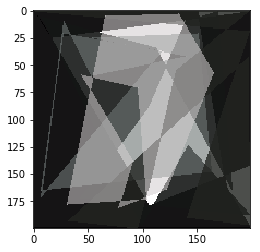

Iteration 52000
improvements 784
Fitness:  0.976549454436


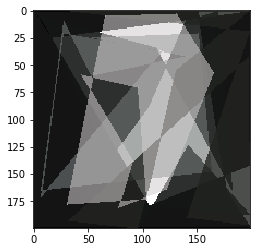

Iteration 53000
improvements 786
Fitness:  0.976552952897


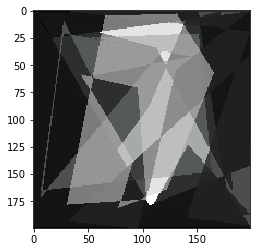

Iteration 54000
improvements 786
Fitness:  0.976552952897


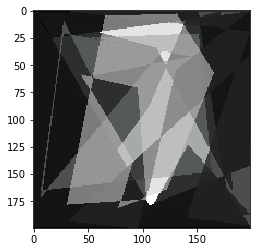

Iteration 55000
improvements 789
Fitness:  0.976554345352


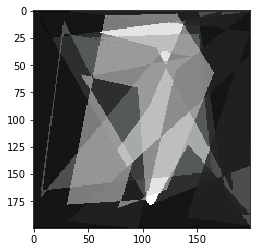

Iteration 56000
improvements 790
Fitness:  0.9765579976


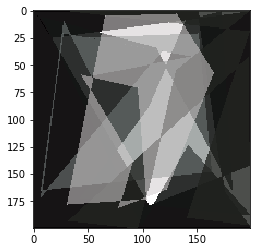

Iteration 57000
improvements 792
Fitness:  0.976564305057


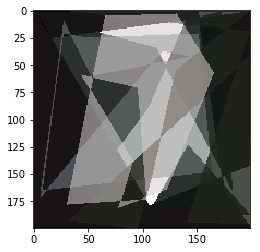

Iteration 58000
improvements 796
Fitness:  0.976569462589


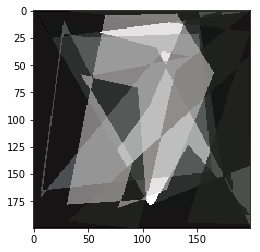

Iteration 59000
improvements 796
Fitness:  0.976569462589


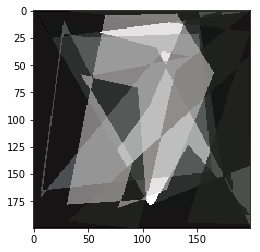

Iteration 60000
improvements 800
Fitness:  0.976634602076


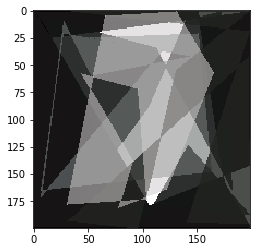

Iteration 61000
improvements 801
Fitness:  0.976640767982


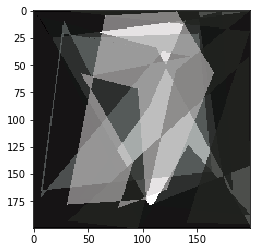

Iteration 62000
improvements 802
Fitness:  0.976641018369


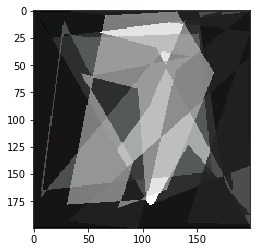

Iteration 63000
improvements 804
Fitness:  0.976675701718


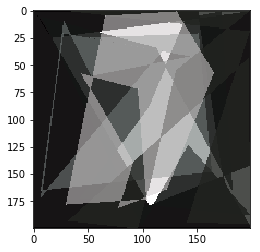

Iteration 64000
improvements 804
Fitness:  0.976675701718


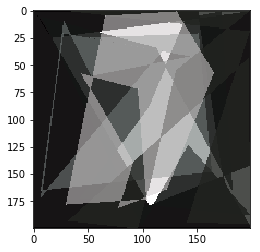

Iteration 65000
improvements 804
Fitness:  0.976675701718


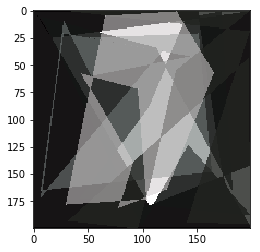

Iteration 66000
improvements 804
Fitness:  0.976675701718


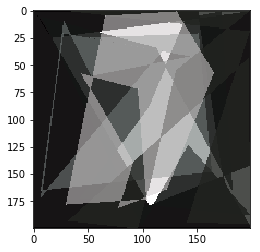

Iteration 67000
improvements 807
Fitness:  0.976677109113


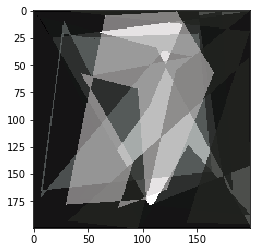

Iteration 68000
improvements 810
Fitness:  0.976738862839


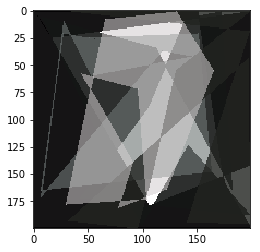

Iteration 69000
improvements 811
Fitness:  0.976744029645


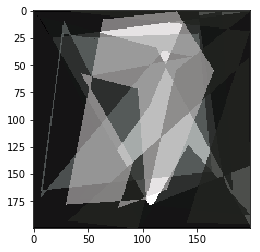

Iteration 70000
improvements 813
Fitness:  0.976745495516


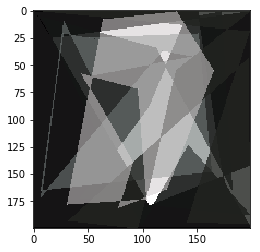

Iteration 71000
improvements 813
Fitness:  0.976745495516


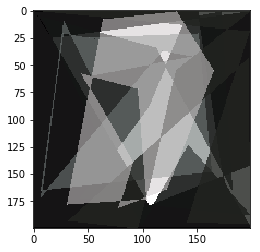

Iteration 72000
improvements 814
Fitness:  0.976747219115


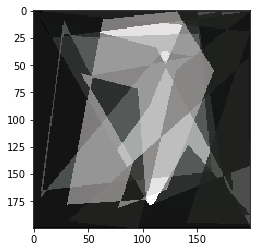

Iteration 73000
improvements 815
Fitness:  0.976748207267


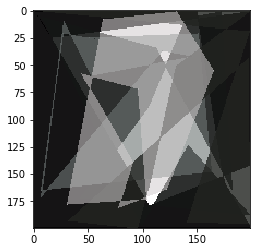

Iteration 74000
improvements 815
Fitness:  0.976748207267


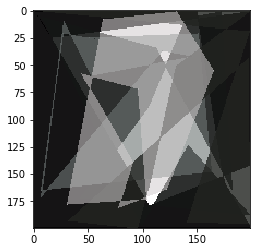

Iteration 75000
improvements 815
Fitness:  0.976748207267


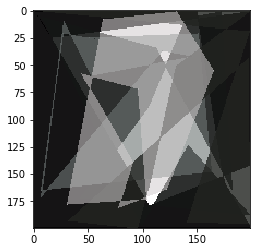

Iteration 76000
improvements 816
Fitness:  0.976760597812


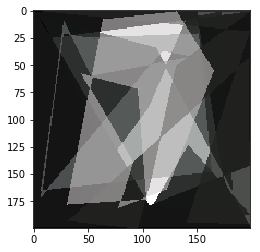

Iteration 77000
improvements 819
Fitness:  0.976777270822


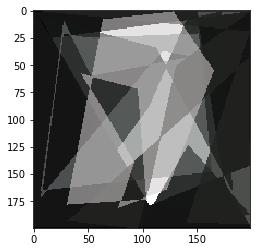

Iteration 78000
improvements 821
Fitness:  0.976784716998


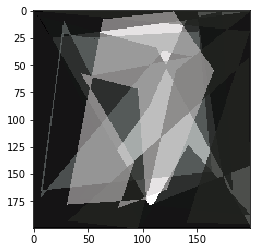

Iteration 79000
improvements 824
Fitness:  0.976805322911


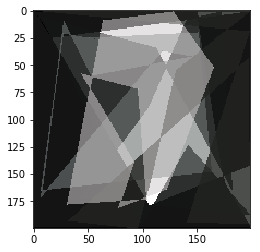

Iteration 80000
improvements 824
Fitness:  0.976805322911


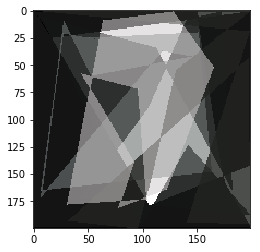

Iteration 81000
improvements 825
Fitness:  0.976815330014


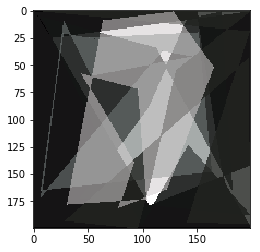

Iteration 82000
improvements 825
Fitness:  0.976815330014


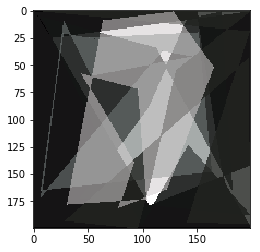

Iteration 83000
improvements 827
Fitness:  0.976823964111


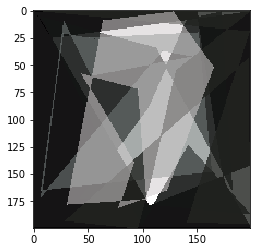

Iteration 84000
improvements 827
Fitness:  0.976823964111


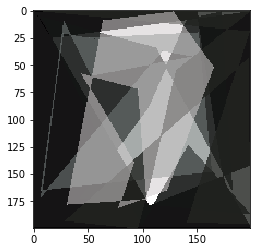

Iteration 85000
improvements 828
Fitness:  0.976828673677


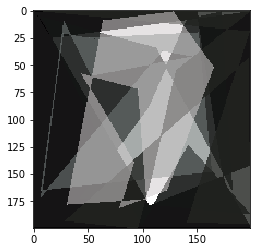

Iteration 86000
improvements 830
Fitness:  0.976845573761


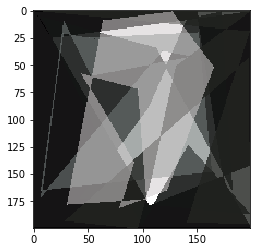

Iteration 87000
improvements 830
Fitness:  0.976845573761


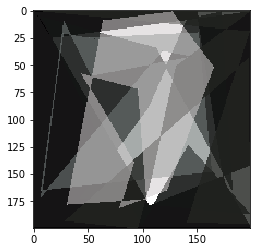

Iteration 88000
improvements 830
Fitness:  0.976845573761


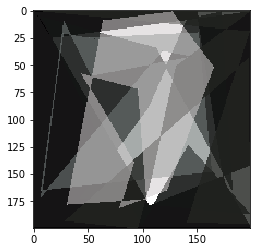

Iteration 89000
improvements 830
Fitness:  0.976845573761


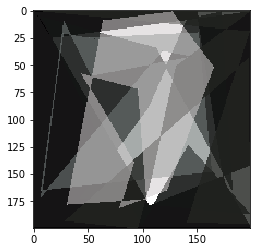

Iteration 90000
improvements 831
Fitness:  0.97684571235


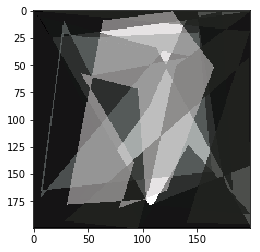

Iteration 91000
improvements 831
Fitness:  0.97684571235


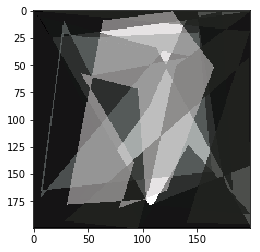

Iteration 92000
improvements 832
Fitness:  0.976849483094


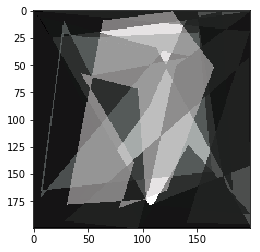

Iteration 93000
improvements 832
Fitness:  0.976849483094


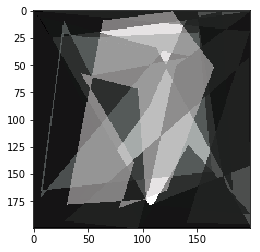

Iteration 94000
improvements 832
Fitness:  0.976849483094


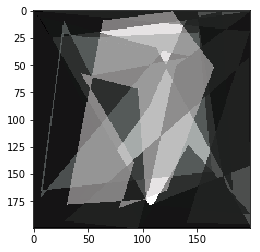

Iteration 95000
improvements 832
Fitness:  0.976849483094


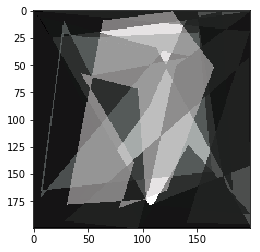

Iteration 96000
improvements 832
Fitness:  0.976849483094


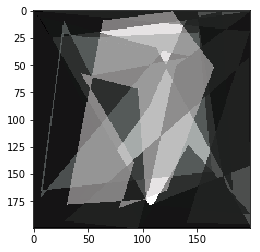

Iteration 97000
improvements 832
Fitness:  0.976849483094


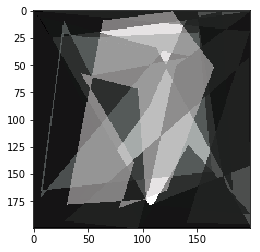

Iteration 98000
improvements 832
Fitness:  0.976849483094


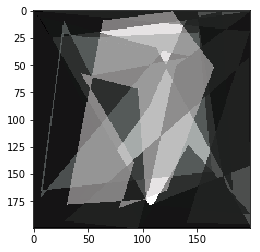

Iteration 99000
improvements 833
Fitness:  0.97686124561


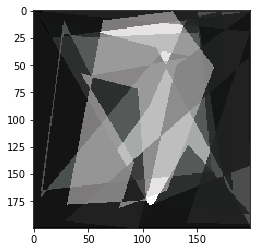

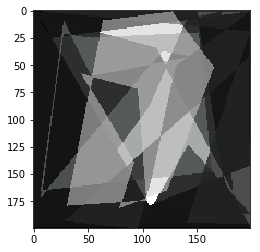

array([  1,   0,   1, 235, 175, 158, 150,   1,   2,   1, 106, 179, 199,
       142, 198,   1,  17,  25,   1,   1,   1, 199, 199, 199,  20,  22,
        21, 228, 199, 187,  43, 172, 105,  89, 141,   8, 172,   1, 182,
       164, 112,  34,   8,   6,  99, 197, 142, 124, 110, 117, 116, 156,
       151,  20, 163, 148,   7, 165,  27,  21, 118,  37,   7, 171,  28,
        10,  53,  60, 146,  42,  50,  25,  34,  36,  35, 206, 131,  51,
       198,   1,   9,   1, 198,  19, 141, 194, 198, 196, 197,  44,  29,
       193,  95, 200, 107, 157, 209, 205, 206, 141,  96,  72, 104, 174,
        31, 179,  64,   9, 127,   1, 165,  52, 122, 165,  79, 181,  92,
       139,  44,  58])

In [26]:
hill(orig_mat, 5, 10, 100000, mut_random=True, mut_change=-1)

Iteration 0
improvements 0
Fit:  112.726326797


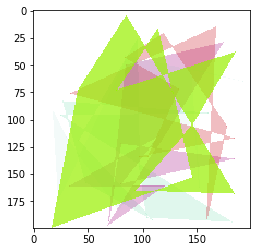

Iteration 1000
improvements 227
Fit:  27.698321411


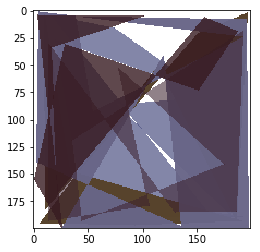

Iteration 2000
improvements 319
Fit:  19.2052166059


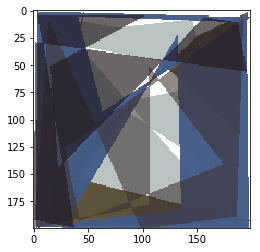

Iteration 3000
improvements 368
Fit:  16.0853573423


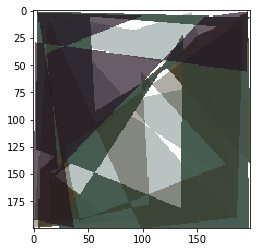

Iteration 4000
improvements 408
Fit:  14.462061451


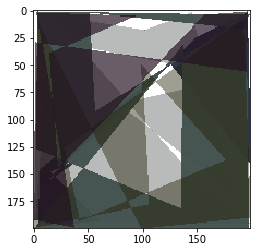

Iteration 5000
improvements 439
Fit:  13.2554144908


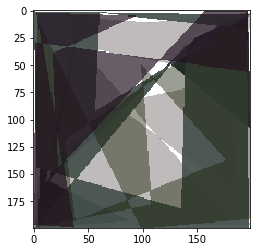

Iteration 6000
improvements 471
Fit:  12.9595971689


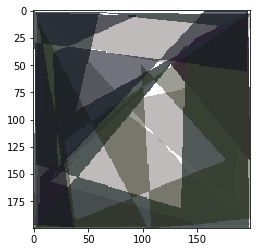

Iteration 7000
improvements 493
Fit:  12.4476773738


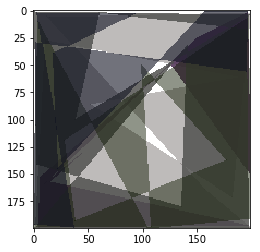

Iteration 8000
improvements 511
Fit:  11.8991426413


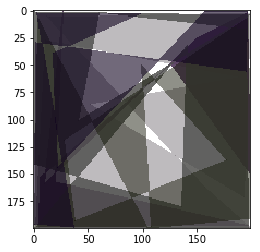

Iteration 9000
improvements 532
Fit:  11.2563845042


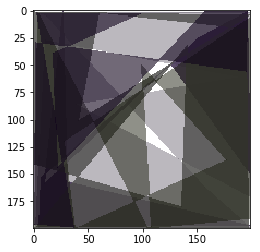

Iteration 10000
improvements 545
Fit:  11.0552443919


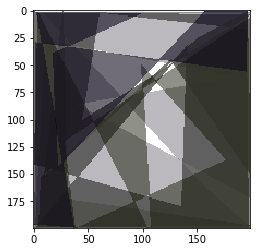

Iteration 11000
improvements 565
Fit:  10.8469733307


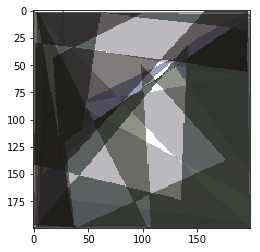

Iteration 12000
improvements 581
Fit:  10.7379283673


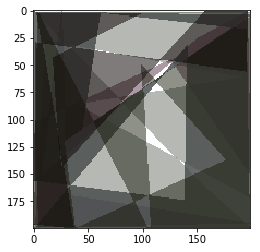

Iteration 13000
improvements 596
Fit:  10.6006900187


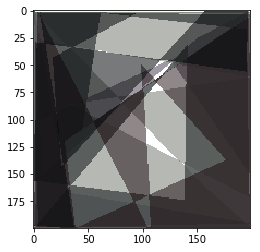

Iteration 14000
improvements 614
Fit:  10.3453532696


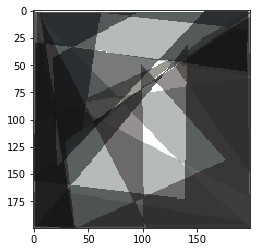

Iteration 15000
improvements 621
Fit:  10.290298683


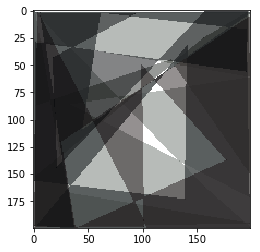

Iteration 16000
improvements 635
Fit:  10.2292810129


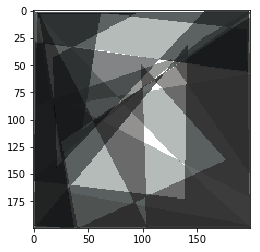

Iteration 17000
improvements 644
Fit:  9.46144671068


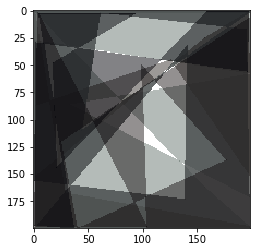

Iteration 18000
improvements 654
Fit:  9.43334850724


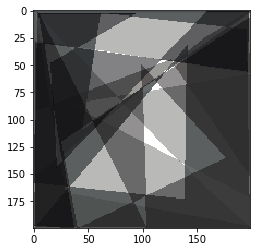

Iteration 19000
improvements 658
Fit:  9.42645383782


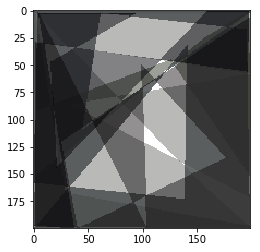

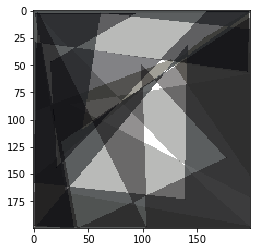

array([ 72,  75,  70,  98,  33,  86, 198, 171, 199,   2,   2,   2,   5,
         5, 157, 162, 199, 199,   2, 199,   1,  28, 199,  58,  38,  34,
        15, 111, 199, 198,  29, 167,   1,   1,   2, 152, 157,  25, 197,
         1, 199, 152, 126,  45,   2,  92,   2, 199,  72,  76,  77, 213,
       139, 173,   1, 158,   1,   1, 199,   1,  44, 110,  61,   2, 198,
        17, 198, 199,   1, 200, 141,  32,   6,   2,   3, 112, 199,   6,
       199, 199, 104, 200,   4,   2,   1, 199, 104, 198,  99,  50, 177,
       135,  40, 200,  25, 120,   1,   1,   6, 125,  93,   3,   2,   3,
        37, 200,   1, 197,   2,  29, 196,  56, 197,   1, 159,   1,  21,
       144,  16,  47])

In [297]:
hill(orig_mat, 5, 10, 20000, mut_random=True, mut_change=-1)  # absolute error instead of square error

Iteration 0
improvements 0
Fitness:  0.693822678174


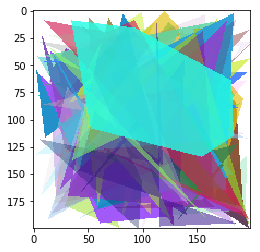

Iteration 1000
improvements 391
Fitness:  0.852113603259


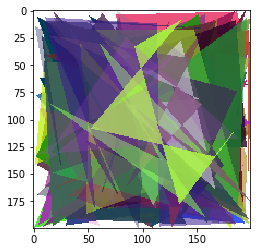

Iteration 2000
improvements 723
Fitness:  0.938640250851


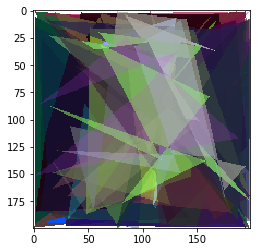

Iteration 3000
improvements 970
Fitness:  0.952211047935


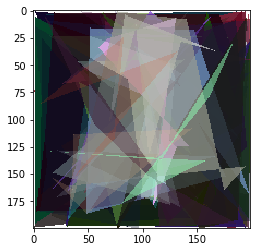

Iteration 4000
improvements 1162
Fitness:  0.955645706683


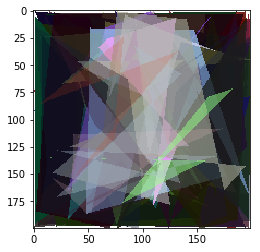

Iteration 5000
improvements 1329
Fitness:  0.961717378898


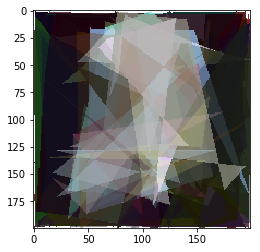

Iteration 6000
improvements 1469
Fitness:  0.968155334406


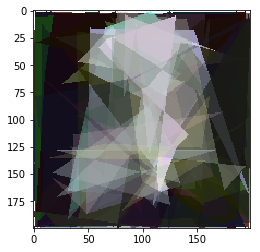

Iteration 7000
improvements 1615
Fitness:  0.971028455748


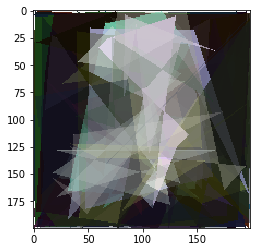

Iteration 8000
improvements 1748
Fitness:  0.976451029336


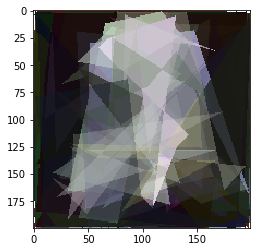

Iteration 9000
improvements 1859
Fitness:  0.977529370678


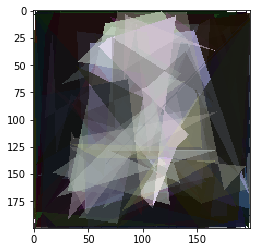

Iteration 10000
improvements 1994
Fitness:  0.979265886784


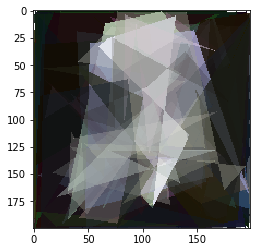

Iteration 11000
improvements 2099
Fitness:  0.97996634164


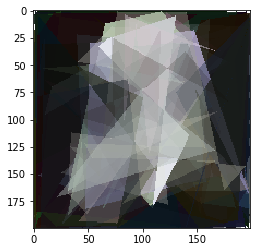

Iteration 12000
improvements 2197
Fitness:  0.980525075847


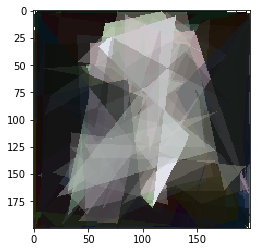

Iteration 13000
improvements 2290
Fitness:  0.98118927999


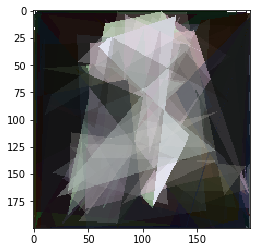

Iteration 14000
improvements 2371
Fitness:  0.981546298711


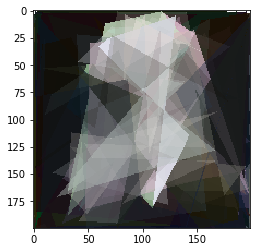

Iteration 15000
improvements 2462
Fitness:  0.981889102439


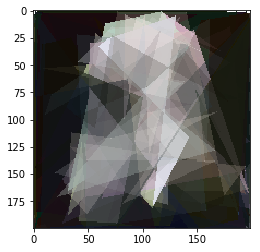

Iteration 16000
improvements 2538
Fitness:  0.982068237896


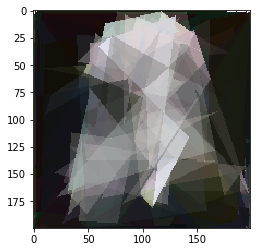

Iteration 17000
improvements 2612
Fitness:  0.982269802943


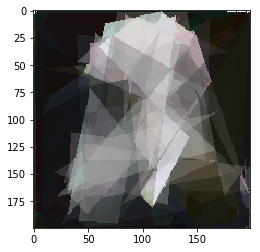

Iteration 18000
improvements 2676
Fitness:  0.982413158835


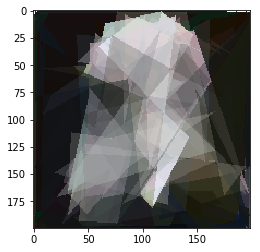

Iteration 19000
improvements 2759
Fitness:  0.98270183353


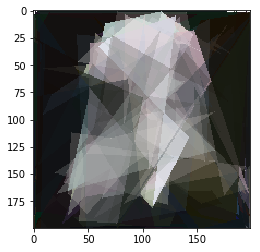

Iteration 20000
improvements 2823
Fitness:  0.982914500608


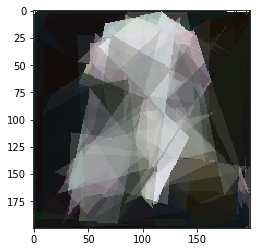

Iteration 21000
improvements 2873
Fitness:  0.983052631992


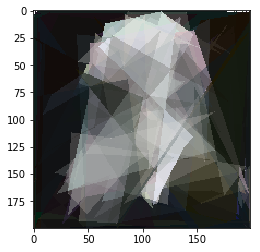

Iteration 22000
improvements 2935
Fitness:  0.983541411401


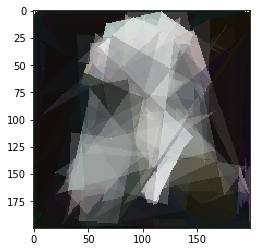

Iteration 23000
improvements 2998
Fitness:  0.983695438361


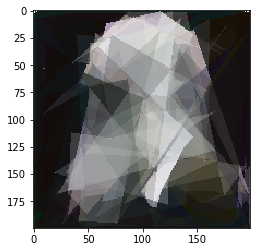

Iteration 24000
improvements 3087
Fitness:  0.983913316036


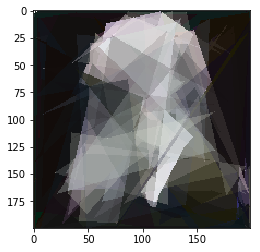

Iteration 25000
improvements 3166
Fitness:  0.984032902691


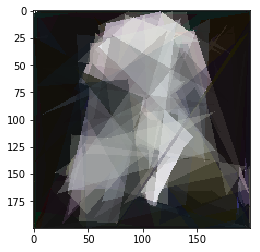

Iteration 26000
improvements 3223
Fitness:  0.984181037702


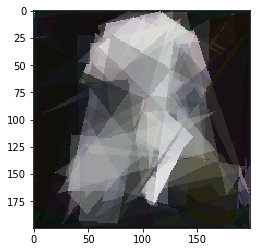

Iteration 27000
improvements 3274
Fitness:  0.98427132935


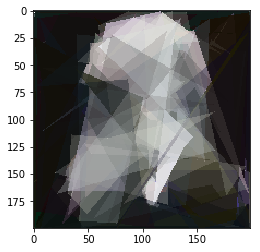

Iteration 28000
improvements 3342
Fitness:  0.984403080634


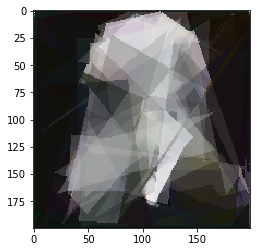

Iteration 29000
improvements 3394
Fitness:  0.984510370126


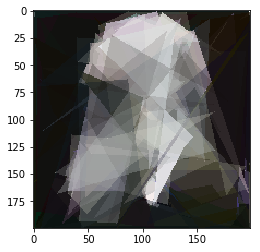

Iteration 30000
improvements 3442
Fitness:  0.98458865531


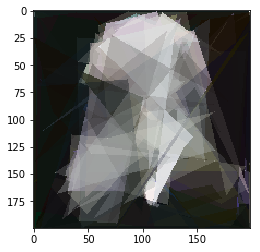

Iteration 31000
improvements 3484
Fitness:  0.984656528316


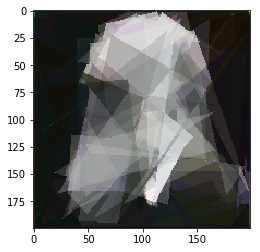

Iteration 32000
improvements 3522
Fitness:  0.984699503541


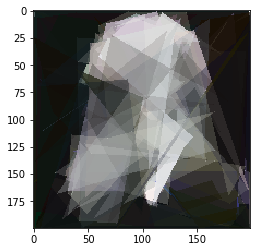

Iteration 33000
improvements 3556
Fitness:  0.984731735443


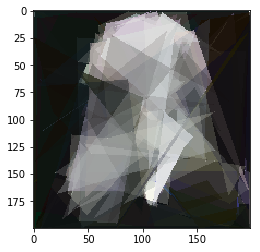

Iteration 34000
improvements 3597
Fitness:  0.984812340828


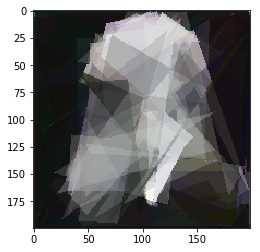

Iteration 35000
improvements 3637
Fitness:  0.984869231715


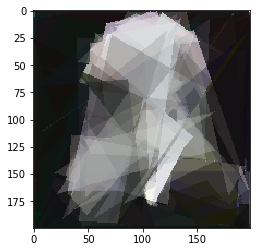

Iteration 36000
improvements 3677
Fitness:  0.984929830235


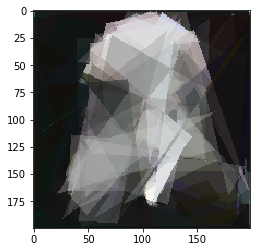

Iteration 37000
improvements 3710
Fitness:  0.984962433467


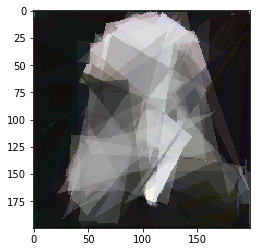

Iteration 38000
improvements 3733
Fitness:  0.984987012211


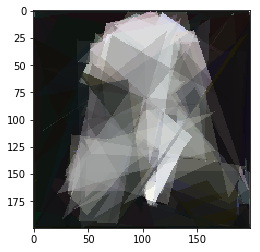

Iteration 39000
improvements 3757
Fitness:  0.985043638157


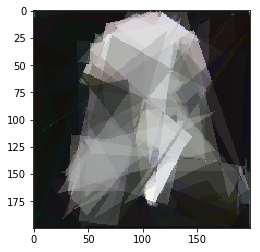

Iteration 40000
improvements 3789
Fitness:  0.985079705332


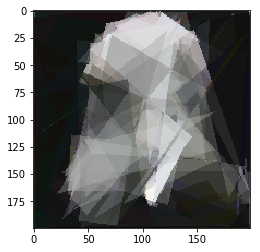

Iteration 41000
improvements 3828
Fitness:  0.985143211379


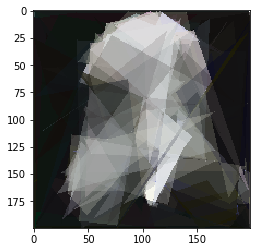

Iteration 42000
improvements 3856
Fitness:  0.985238784722


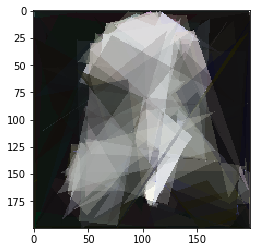

Iteration 43000
improvements 3882
Fitness:  0.98525375268


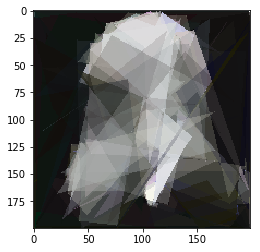

Iteration 44000
improvements 3909
Fitness:  0.985295231508


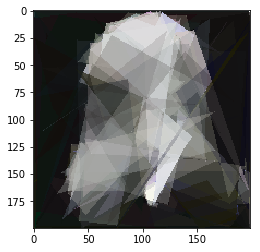

Iteration 45000
improvements 3931
Fitness:  0.985347509043


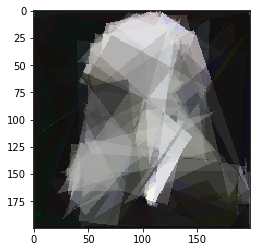

Iteration 46000
improvements 3962
Fitness:  0.985382009754


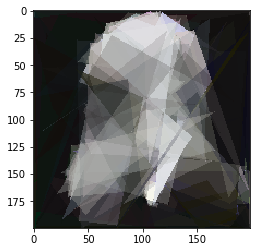

Iteration 47000
improvements 3986
Fitness:  0.985404778474


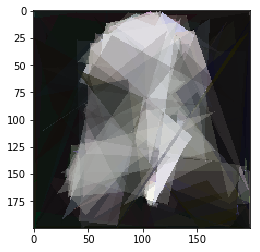

Iteration 48000
improvements 4009
Fitness:  0.98541929048


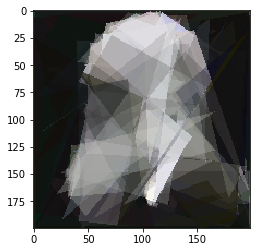

Iteration 49000
improvements 4034
Fitness:  0.985464928126


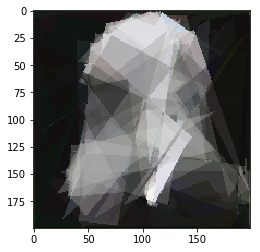

Iteration 50000
improvements 4060
Fitness:  0.98550950575


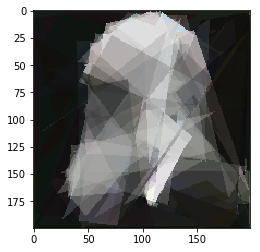

Iteration 51000
improvements 4082
Fitness:  0.985525675797


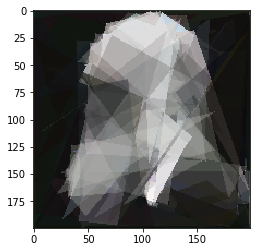

Iteration 52000
improvements 4109
Fitness:  0.98555651022


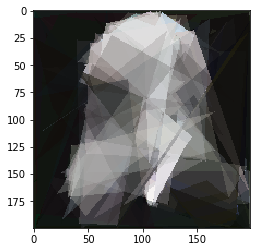

Iteration 53000
improvements 4134
Fitness:  0.985589394364


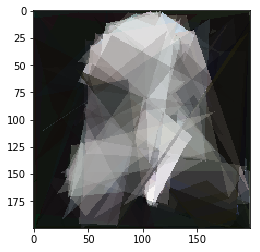

Iteration 54000
improvements 4157
Fitness:  0.985608418615


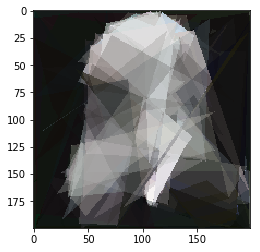

Iteration 55000
improvements 4176
Fitness:  0.985631547202


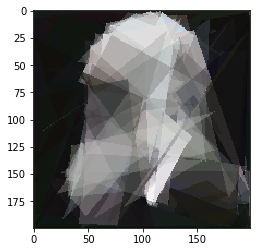

Iteration 56000
improvements 4208
Fitness:  0.985679186784


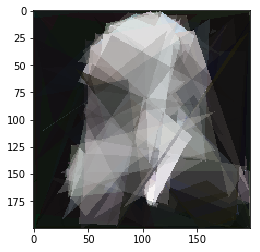

Iteration 57000
improvements 4232
Fitness:  0.985695630015


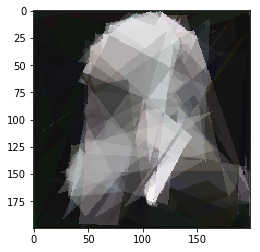

Iteration 58000
improvements 4257
Fitness:  0.985716367046


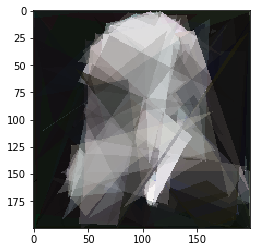

Iteration 59000
improvements 4278
Fitness:  0.985742882682


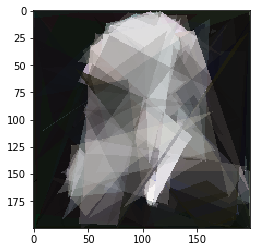

Iteration 60000
improvements 4295
Fitness:  0.985772978696


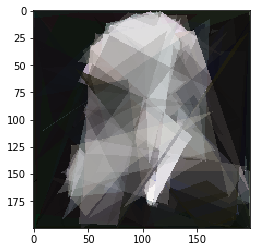

Iteration 61000
improvements 4310
Fitness:  0.985797611536


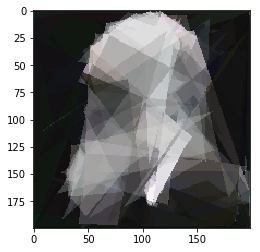

Iteration 62000
improvements 4325
Fitness:  0.985814276689


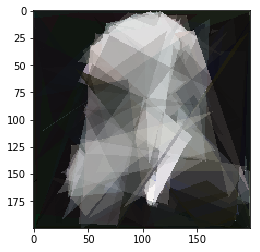

Iteration 63000
improvements 4351
Fitness:  0.985848916504


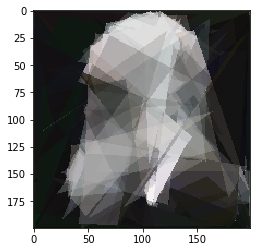

Iteration 64000
improvements 4363
Fitness:  0.985856843232


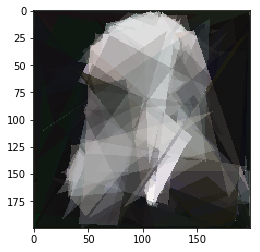

Iteration 65000
improvements 4380
Fitness:  0.985866304739


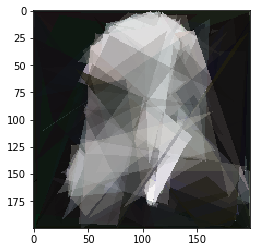

Iteration 66000
improvements 4391
Fitness:  0.985872783629


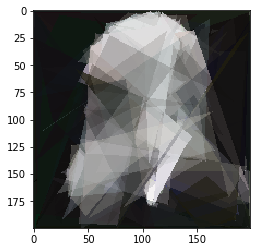

Iteration 67000
improvements 4407
Fitness:  0.985880771022


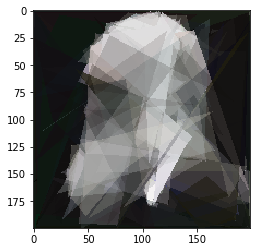

Iteration 68000
improvements 4426
Fitness:  0.985899599883


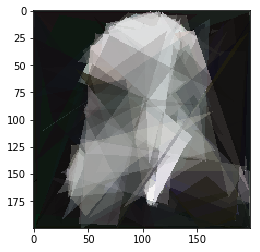

Iteration 69000
improvements 4441
Fitness:  0.985930611149


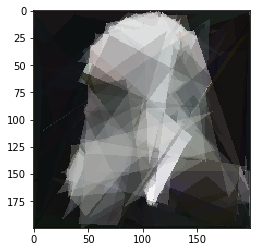

Iteration 70000
improvements 4455
Fitness:  0.985934080372


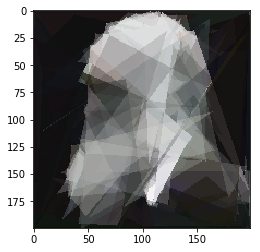

Iteration 71000
improvements 4471
Fitness:  0.985977394083


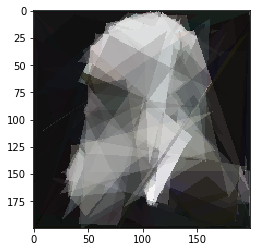

Iteration 72000
improvements 4494
Fitness:  0.985990441764


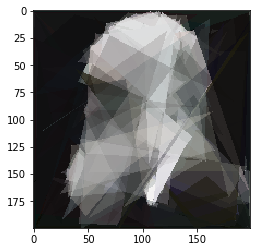

Iteration 73000
improvements 4510
Fitness:  0.986012613497


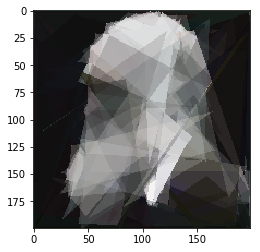

Iteration 74000
improvements 4524
Fitness:  0.986020810061


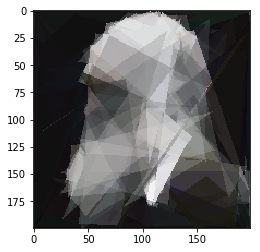

Iteration 75000
improvements 4537
Fitness:  0.986024399326


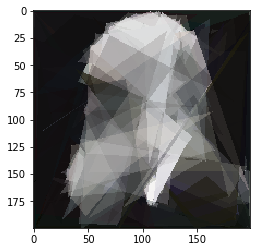

Iteration 76000
improvements 4553
Fitness:  0.986039851571


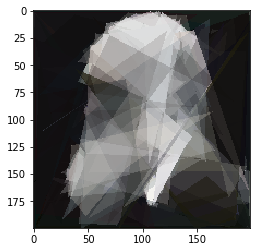

Iteration 77000
improvements 4572
Fitness:  0.986058651453


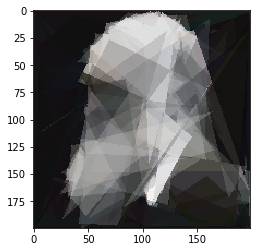

Iteration 78000
improvements 4583
Fitness:  0.986061232602


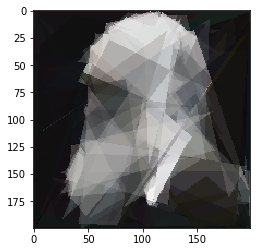

Iteration 79000
improvements 4601
Fitness:  0.986077192705


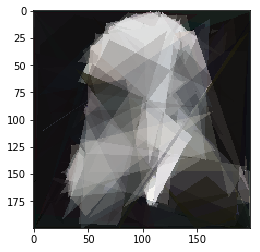

Iteration 80000
improvements 4618
Fitness:  0.986097056344


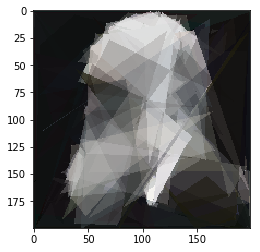

Iteration 81000
improvements 4637
Fitness:  0.986101121782


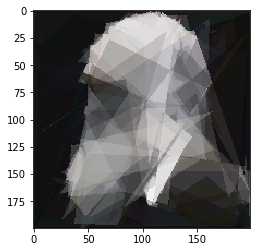

Iteration 82000
improvements 4655
Fitness:  0.986116224078


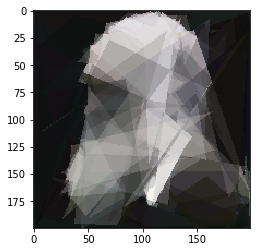

Iteration 83000
improvements 4675
Fitness:  0.986130535028


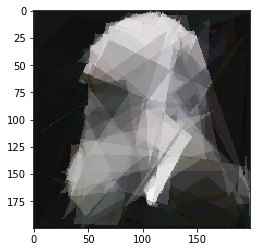

Iteration 84000
improvements 4690
Fitness:  0.986143641184


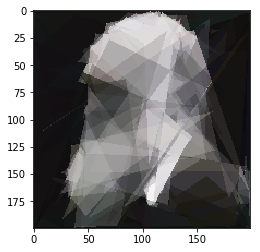

Iteration 85000
improvements 4701
Fitness:  0.986151671468


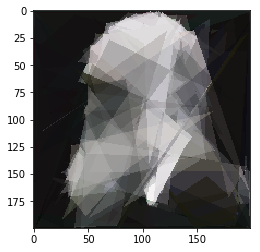

Iteration 86000
improvements 4718
Fitness:  0.986161759457


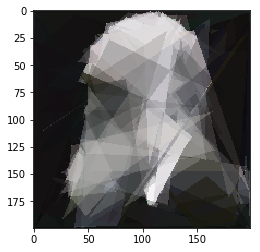

Iteration 87000
improvements 4735
Fitness:  0.986167214646


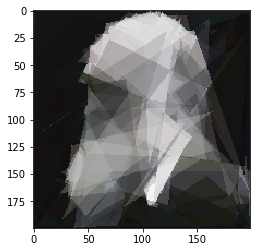

Iteration 88000
improvements 4756
Fitness:  0.986177958226


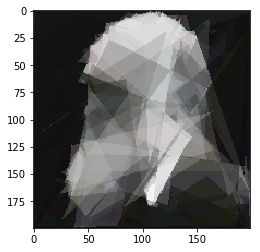

Iteration 89000
improvements 4775
Fitness:  0.986188659432


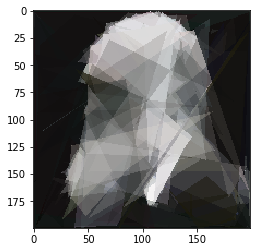

Iteration 90000
improvements 4788
Fitness:  0.98619628039


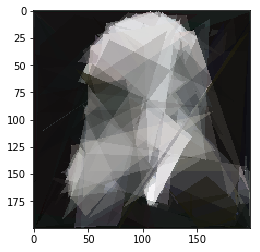

Iteration 91000
improvements 4799
Fitness:  0.986198827277


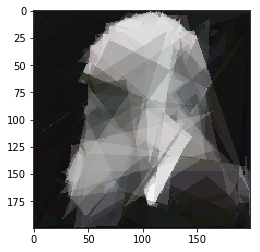

Iteration 92000
improvements 4816
Fitness:  0.986206044576


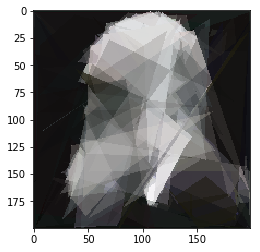

Iteration 93000
improvements 4830
Fitness:  0.986211341985


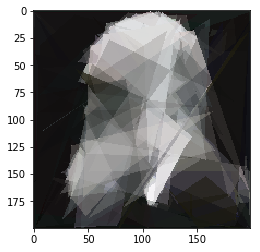

Iteration 94000
improvements 4845
Fitness:  0.986218326929


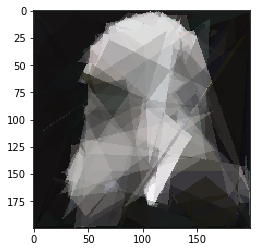

Iteration 95000
improvements 4861
Fitness:  0.986231379118


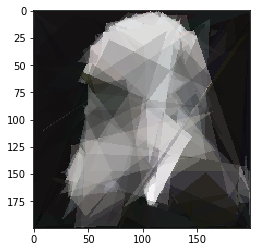

Iteration 96000
improvements 4869
Fitness:  0.986237796698


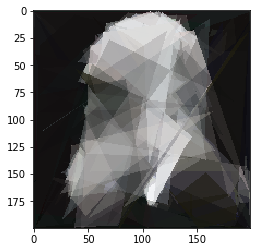

Iteration 97000
improvements 4882
Fitness:  0.986241356211


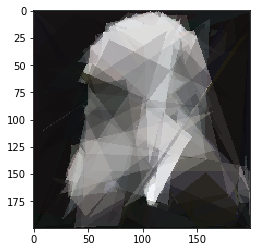

Iteration 98000
improvements 4889
Fitness:  0.986244859695


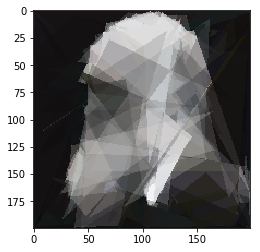

Iteration 99000
improvements 4902
Fitness:  0.986256838982


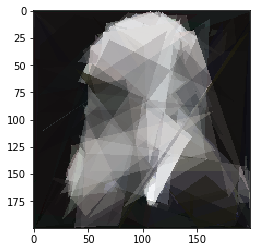

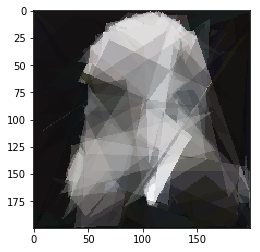

array([ 17,  33,  15, 229, 105,  95,  36, 194, 182, 116,  55, 119,  87,
         3,   4,   2,  14,  25,  21, 251,  94, 175, 146, 179, 197, 176,
       199, 199,   1,   1, 197,   1,   2,   0,   0, 253, 157,  12, 158,
        77, 196, 200, 134, 192, 107, 159, 120,  30, 203, 224, 215, 231,
         7,  22, 131,   4, 103, 180, 164,  17, 176,  18, 193, 145, 236,
       231, 219, 217, 125, 178,  54, 167, 181, 199, 190, 171,  78, 159,
       123,   5,   8,   8,   8, 245,  12, 143,  57,  73, 199,   7, 198,
       147,   1,  16,   1, 199,  18,  29,  24, 255,   2,  24, 163, 157,
       199,  62, 199,   1, 123, 110,   2,   4,  89,  71,  74, 175,  41,
        16,  27, 199,  10, 179,   5, 144, 123, 150,  49, 147,   2,  23,
        10, 247,  73,  88,   1, 199,  51, 106, 198, 147, 196, 126,   1,
       157, 152, 161, 160, 231,   4, 176, 156, 159,   7, 135, 144, 164,
       136,  13, 174, 164,  25,  26,  27, 201, 196,  19, 124, 184,   4,
       199, 199, 199, 199,   1,  93,   1, 193, 212, 225, 217,  7

In [35]:
hill(orig_mat, 50, 6, 100000, mut_random=True, mut_change=-1)

Iteration 0
improvements 0
Fitness:  0.75565853373


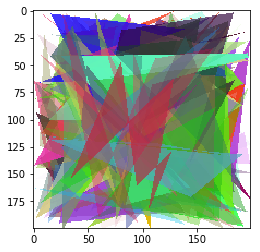

Iteration 1000
improvements 407
Fitness:  0.851733448738


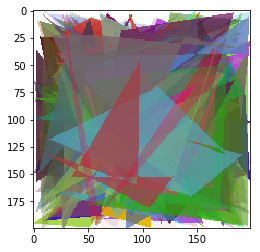

Iteration 2000
improvements 739
Fitness:  0.889548786609


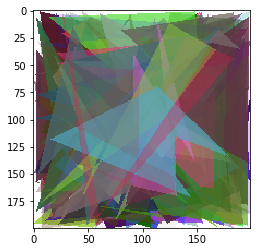

Iteration 3000
improvements 1044
Fitness:  0.914682954823


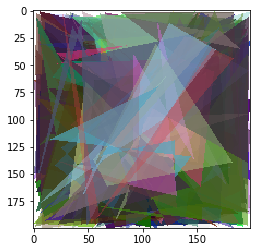

Iteration 4000
improvements 1313
Fitness:  0.930594123507


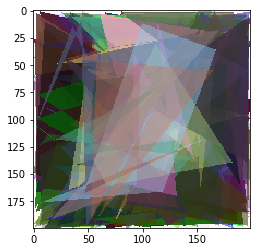

Iteration 5000
improvements 1563
Fitness:  0.942797553061


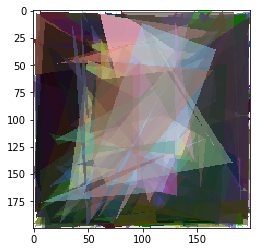

Iteration 6000
improvements 1769
Fitness:  0.950272893881


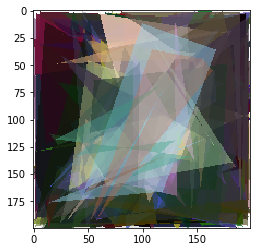

Iteration 7000
improvements 1975
Fitness:  0.957955828225


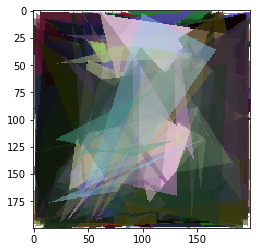

Iteration 8000
improvements 2177
Fitness:  0.962910669714


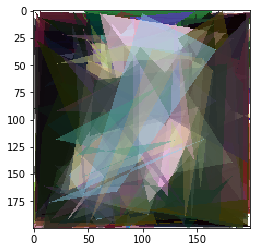

Iteration 9000
improvements 2365
Fitness:  0.967929020986


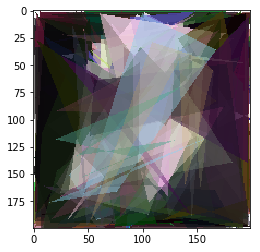

Iteration 10000
improvements 2540
Fitness:  0.9707360456


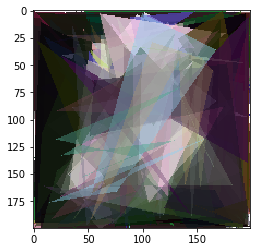

Iteration 11000
improvements 2706
Fitness:  0.973153684609


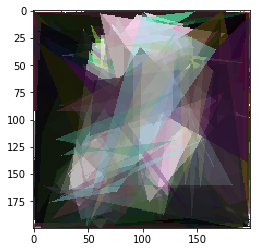

Iteration 12000
improvements 2865
Fitness:  0.974610557594


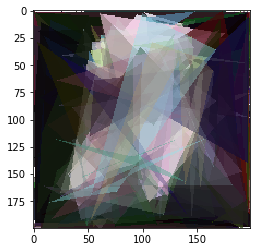

Iteration 13000
improvements 2999
Fitness:  0.975519831633


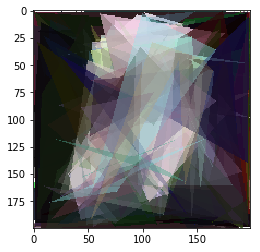

Iteration 14000
improvements 3162
Fitness:  0.9764550609


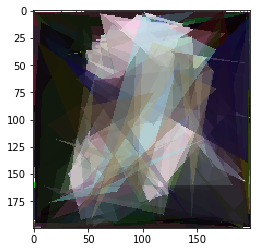

Iteration 15000
improvements 3278
Fitness:  0.976851494819


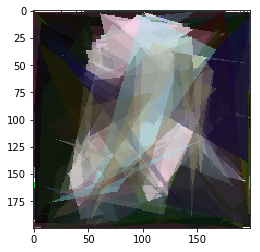

Iteration 16000
improvements 3394
Fitness:  0.978074833478


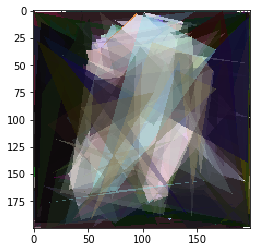

Iteration 17000
improvements 3513
Fitness:  0.979010762643


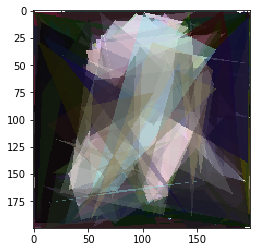

Iteration 18000
improvements 3618
Fitness:  0.979615426356


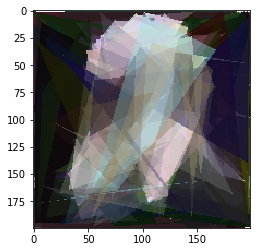

Iteration 19000
improvements 3738
Fitness:  0.980288659754


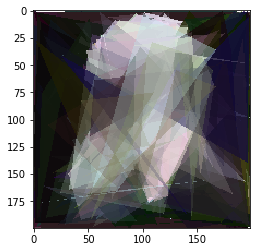

Iteration 20000
improvements 3840
Fitness:  0.9807044188


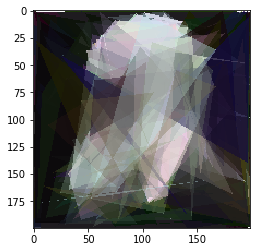

Iteration 21000
improvements 3962
Fitness:  0.98127770404


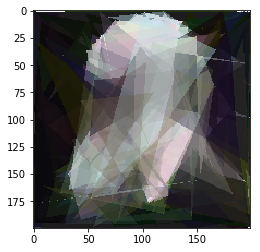

Iteration 22000
improvements 4076
Fitness:  0.981758555433


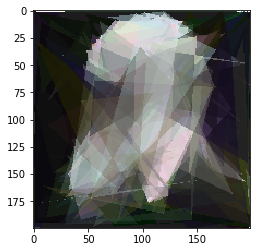

Iteration 23000
improvements 4184
Fitness:  0.982106552498


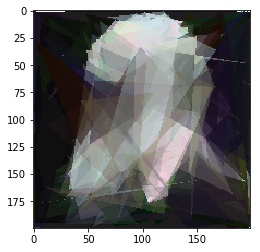

Iteration 24000
improvements 4288
Fitness:  0.982426640443


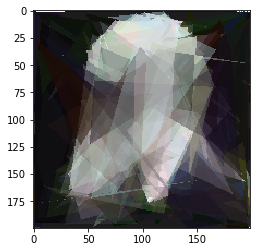

Iteration 25000
improvements 4378
Fitness:  0.982587169089


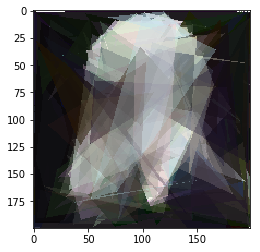

Iteration 26000
improvements 4482
Fitness:  0.982891260609


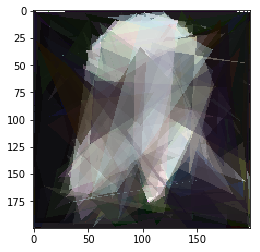

Iteration 27000
improvements 4571
Fitness:  0.98307900041


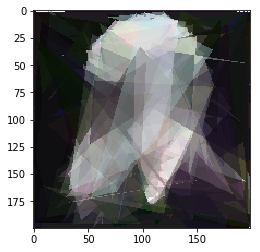

Iteration 28000
improvements 4659
Fitness:  0.983226068829


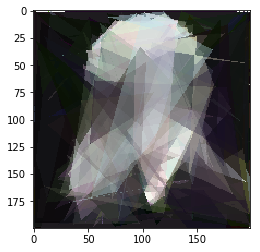

Iteration 29000
improvements 4752
Fitness:  0.983399671689


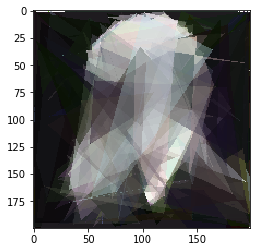

Iteration 30000
improvements 4837
Fitness:  0.983552113122


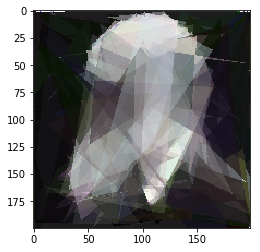

Iteration 31000
improvements 4914
Fitness:  0.983638835856


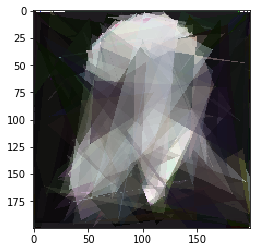

Iteration 32000
improvements 4991
Fitness:  0.983774800827


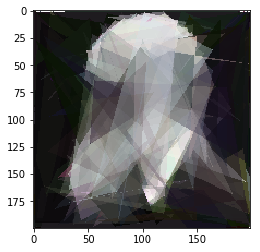

Iteration 33000
improvements 5075
Fitness:  0.983864574442


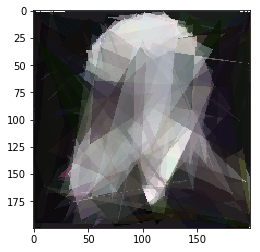

Iteration 34000
improvements 5165
Fitness:  0.983951084269


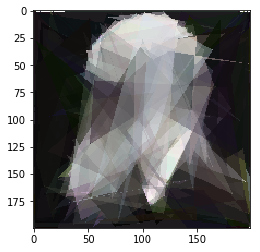

Iteration 35000
improvements 5257
Fitness:  0.984059268146


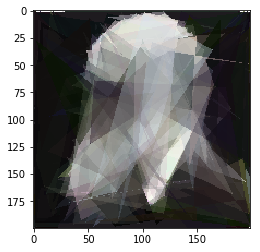

Iteration 36000
improvements 5349
Fitness:  0.984176499053


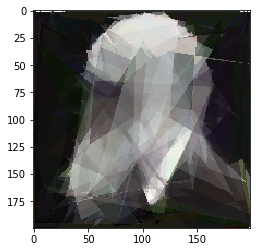

Iteration 37000
improvements 5428
Fitness:  0.984292513574


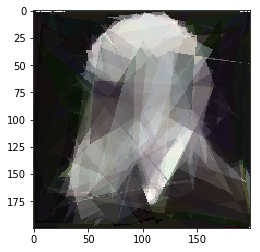

Iteration 38000
improvements 5492
Fitness:  0.984354052075


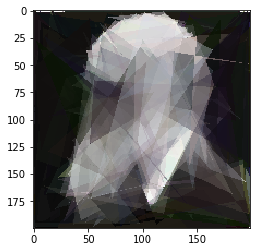

Iteration 39000
improvements 5575
Fitness:  0.984420877166


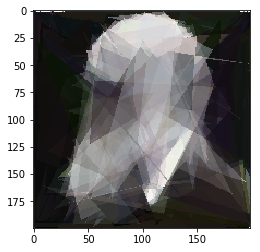

Iteration 40000
improvements 5646
Fitness:  0.984494897015


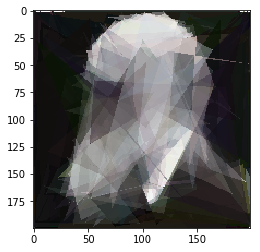

Iteration 41000
improvements 5733
Fitness:  0.984560512288


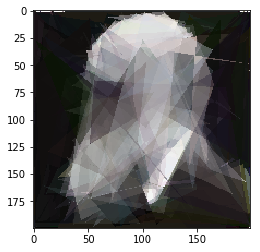

Iteration 42000
improvements 5793
Fitness:  0.984648124256


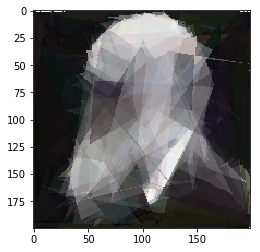

Iteration 43000
improvements 5873
Fitness:  0.984726816448


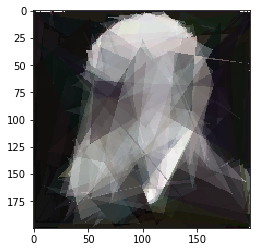

Iteration 44000
improvements 5936
Fitness:  0.984770894972


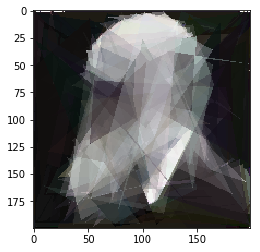

Iteration 45000
improvements 6000
Fitness:  0.984809043938


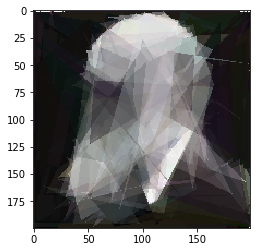

Iteration 46000
improvements 6050
Fitness:  0.984873826263


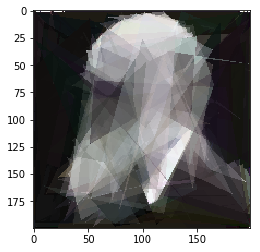

Iteration 47000
improvements 6108
Fitness:  0.984987167028


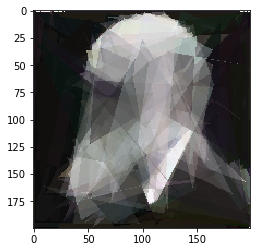

Iteration 48000
improvements 6189
Fitness:  0.985049002027


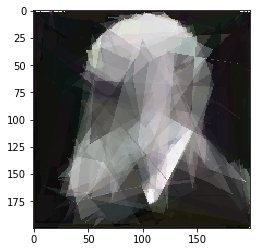

Iteration 49000
improvements 6245
Fitness:  0.985078521532


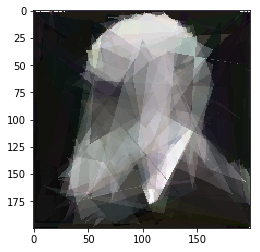

Iteration 50000
improvements 6317
Fitness:  0.985160186682


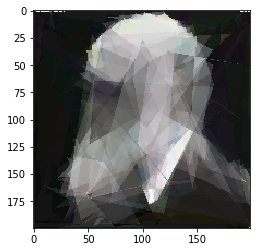

Iteration 51000
improvements 6398
Fitness:  0.985264958523


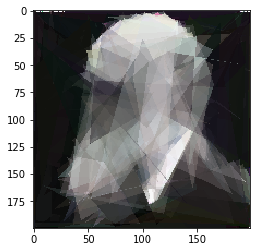

Iteration 52000
improvements 6479
Fitness:  0.985330684178


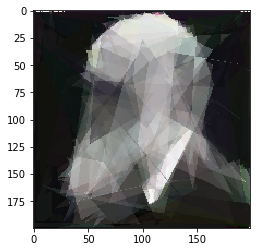

Iteration 53000
improvements 6558
Fitness:  0.985425493867


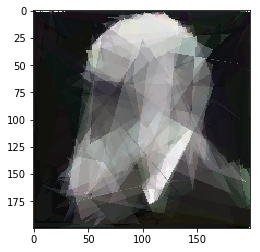

Iteration 54000
improvements 6616
Fitness:  0.985489184227


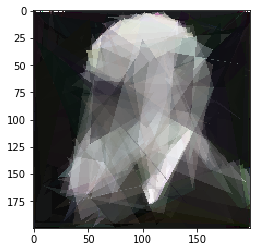

Iteration 55000
improvements 6680
Fitness:  0.985540643883


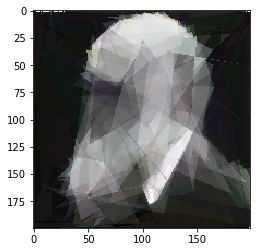

Iteration 56000
improvements 6742
Fitness:  0.985590211212


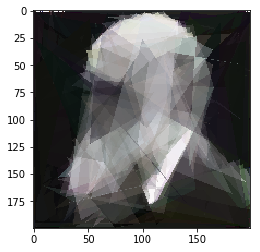

Iteration 57000
improvements 6788
Fitness:  0.985634520803


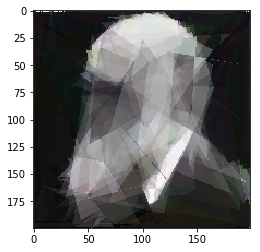

Iteration 58000
improvements 6861
Fitness:  0.985867596601


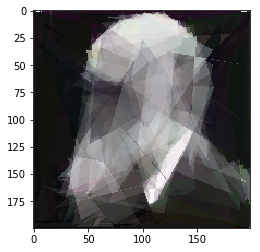

Iteration 59000
improvements 6924
Fitness:  0.98590502519


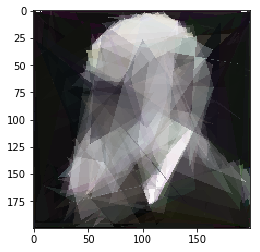

Iteration 60000
improvements 6985
Fitness:  0.985945087993


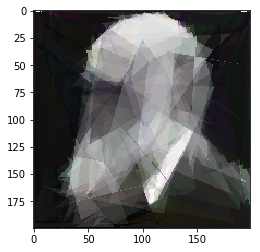

Iteration 61000
improvements 7045
Fitness:  0.986006370569


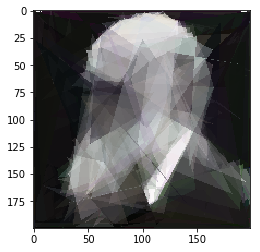

Iteration 62000
improvements 7110
Fitness:  0.986034282395


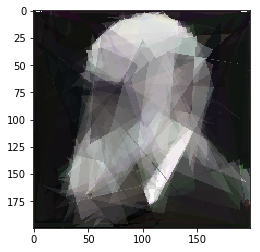

Iteration 63000
improvements 7177
Fitness:  0.986056884834


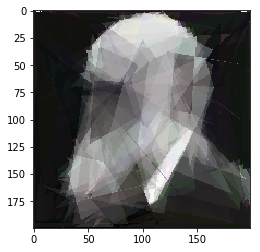

Iteration 64000
improvements 7238
Fitness:  0.986122191117


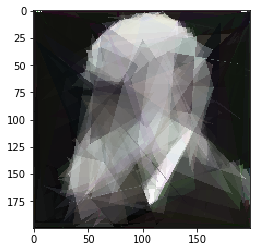

Iteration 65000
improvements 7304
Fitness:  0.986288716684


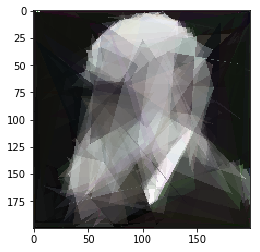

Iteration 66000
improvements 7339
Fitness:  0.986312316806


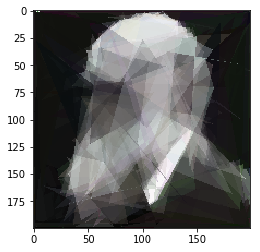

Iteration 67000
improvements 7386
Fitness:  0.986355428173


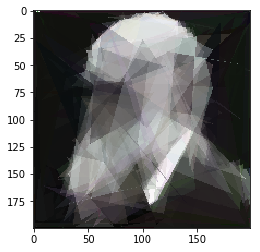

Iteration 68000
improvements 7423
Fitness:  0.986372650514


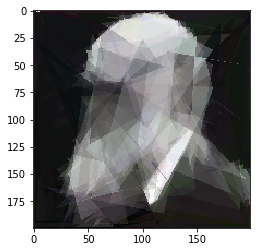

Iteration 69000
improvements 7469
Fitness:  0.98639022435


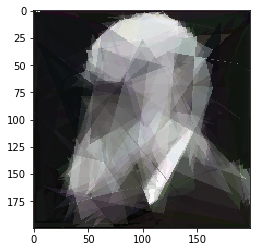

Iteration 70000
improvements 7515
Fitness:  0.986412903554


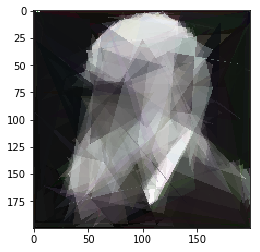

Iteration 71000
improvements 7572
Fitness:  0.986442762834


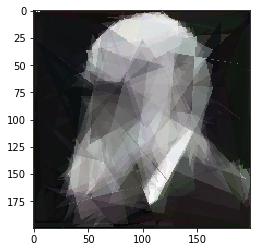

Iteration 72000
improvements 7619
Fitness:  0.986473529637


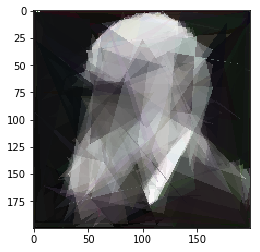

Iteration 73000
improvements 7673
Fitness:  0.986504732686


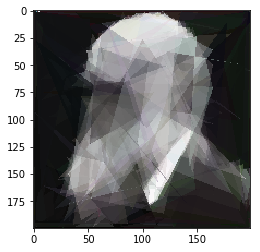

Iteration 74000
improvements 7732
Fitness:  0.986525845812


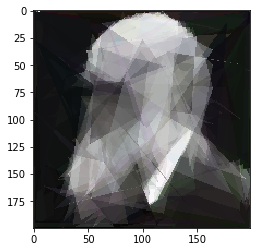

Iteration 75000
improvements 7785
Fitness:  0.986536268553


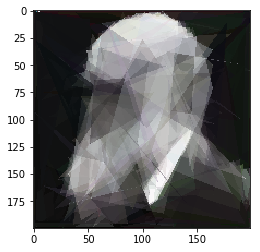

Iteration 76000
improvements 7837
Fitness:  0.98655216271


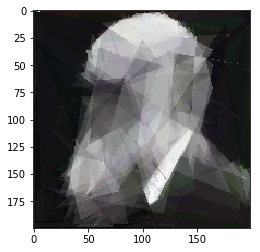

Iteration 77000
improvements 7880
Fitness:  0.986580096046


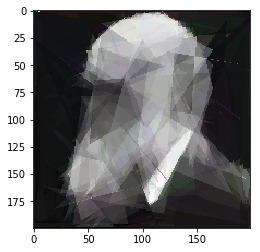

Iteration 78000
improvements 7925
Fitness:  0.986610590051


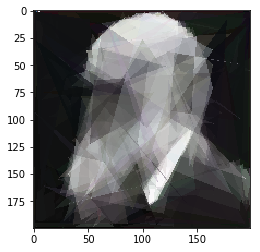

Iteration 79000
improvements 7968
Fitness:  0.986620891591


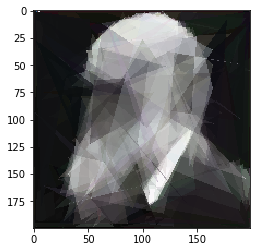

Iteration 80000
improvements 8015
Fitness:  0.986635597184


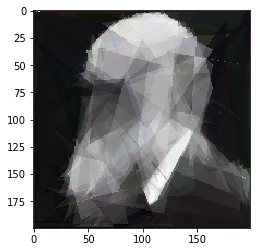

Iteration 81000
improvements 8071
Fitness:  0.98667085923


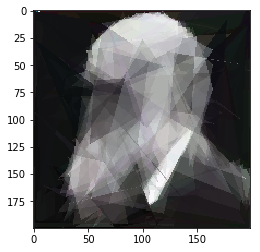

Iteration 82000
improvements 8112
Fitness:  0.98668872029


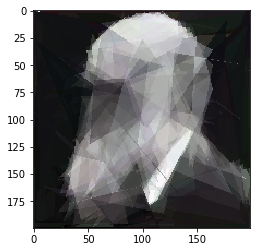

Iteration 83000
improvements 8157
Fitness:  0.986708305722


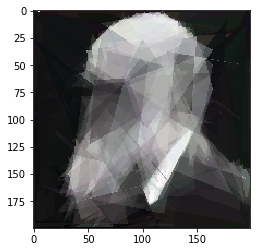

Iteration 84000
improvements 8208
Fitness:  0.9867265479


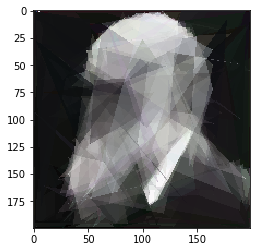

Iteration 85000
improvements 8245
Fitness:  0.986739347127


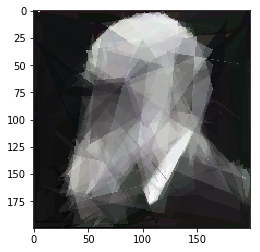

Iteration 86000
improvements 8288
Fitness:  0.986756373177


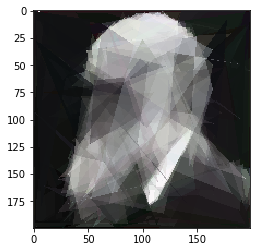

Iteration 87000
improvements 8323
Fitness:  0.986775006134


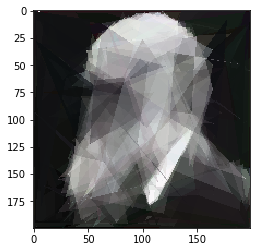

Iteration 88000
improvements 8363
Fitness:  0.986789045445


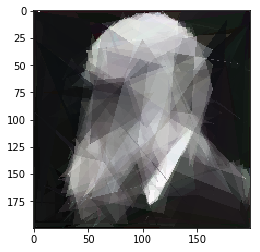

Iteration 89000
improvements 8410
Fitness:  0.986804661008


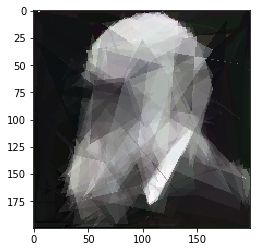

Iteration 90000
improvements 8438
Fitness:  0.98682187691


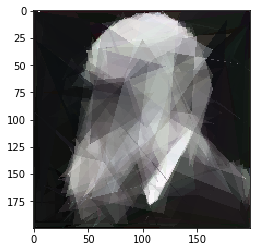

Iteration 91000
improvements 8480
Fitness:  0.986847427577


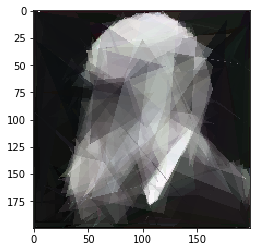

Iteration 92000
improvements 8513
Fitness:  0.986865885624


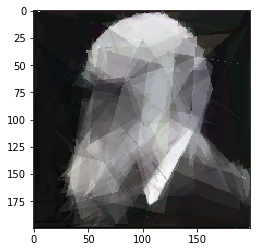

Iteration 93000
improvements 8550
Fitness:  0.986875607823


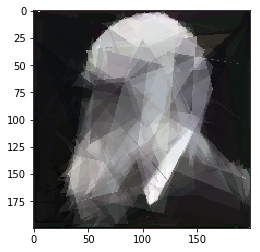

Iteration 94000
improvements 8584
Fitness:  0.986893648687


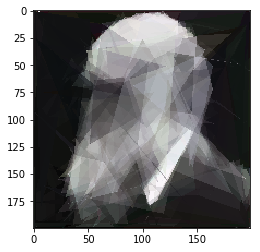

Iteration 95000
improvements 8622
Fitness:  0.986913585871


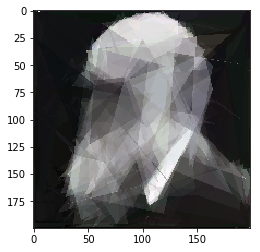

Iteration 96000
improvements 8648
Fitness:  0.986922351602


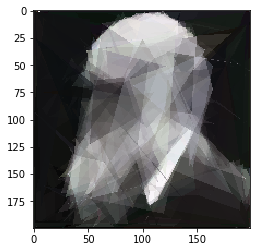

Iteration 97000
improvements 8684
Fitness:  0.986930891804


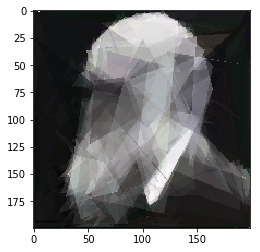

Iteration 98000
improvements 8719
Fitness:  0.986962177542


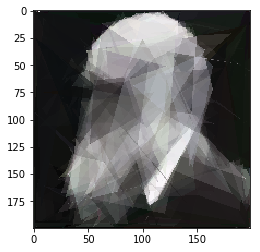

Iteration 99000
improvements 8753
Fitness:  0.986971007414


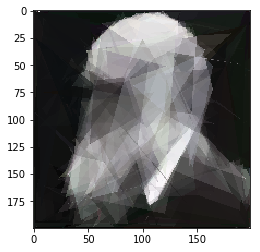

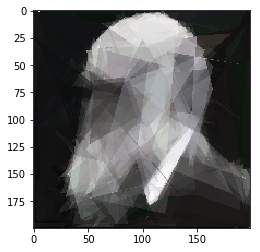

array([  3,   1,   0, ...,  40, 164,  51])

In [37]:
hill(orig_mat, 100, 6, 100000, mut_random=True, mut_change=-1)

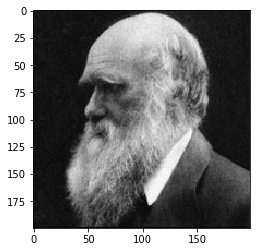

In [348]:
plt.imshow(orig_mat)
plt.show()

Iteration 0
improvements 0
Fit:  0.101980648732


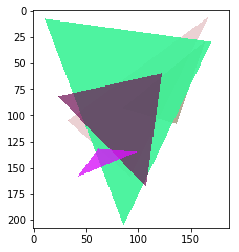

Iteration 1000
improvements 138
Fit:  0.0258512099129


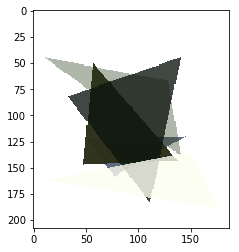

Iteration 2000
improvements 195
Fit:  0.0175149009497


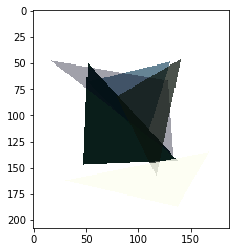

Iteration 3000
improvements 251
Fit:  0.00849506220461


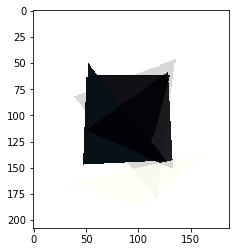

Iteration 4000
improvements 285
Fit:  0.00415402715881


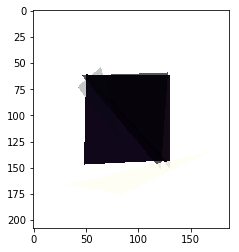

Iteration 5000
improvements 299
Fit:  0.00395299079402


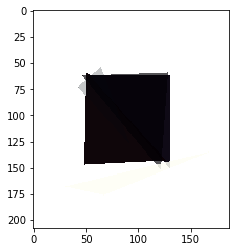

Iteration 6000
improvements 310
Fit:  0.00391328871127


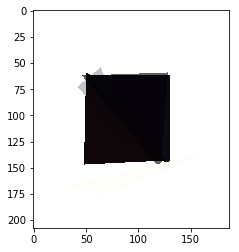

Iteration 7000
improvements 326
Fit:  0.0024489017477


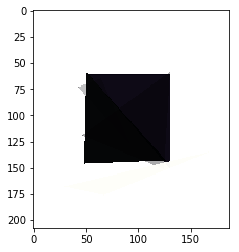

Iteration 8000
improvements 341
Fit:  0.00214520391144


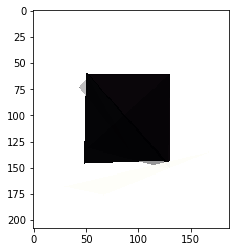

Iteration 9000
improvements 346
Fit:  0.00207171212667


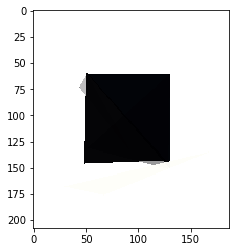

Iteration 10000
improvements 351
Fit:  0.0020427194384


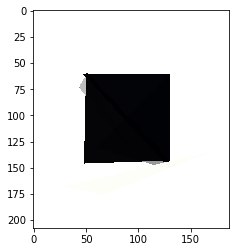

Iteration 11000
improvements 358
Fit:  0.0019953023057


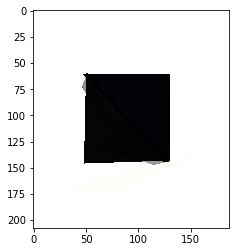

Iteration 12000
improvements 377
Fit:  0.000882067608609


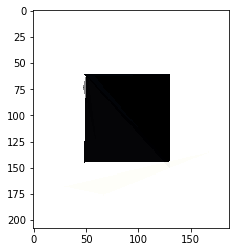

Iteration 13000
improvements 387
Fit:  0.00087247226317


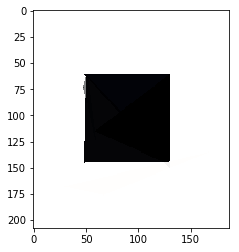

Iteration 14000
improvements 391
Fit:  0.000848860301333


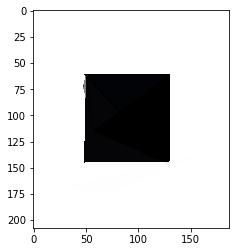

Iteration 15000
improvements 394
Fit:  0.000840381509016


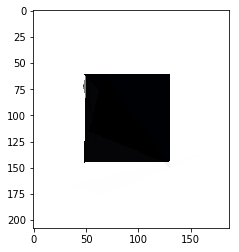

Iteration 16000
improvements 398
Fit:  0.000835912265283


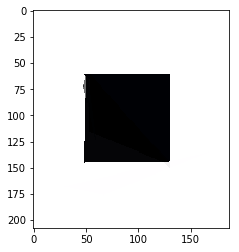

Iteration 17000
improvements 404
Fit:  0.000831098381984


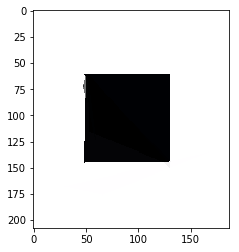

Iteration 18000
improvements 407
Fit:  0.000821634566292


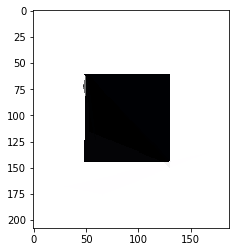

Iteration 19000
improvements 410
Fit:  0.000806517870939


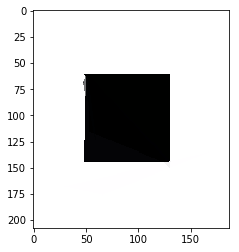

Iteration 20000
improvements 420
Fit:  0.000804077453782


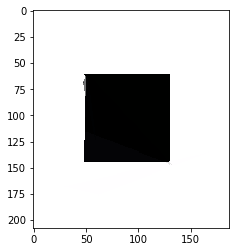

Iteration 21000
improvements 428
Fit:  0.000756435218068


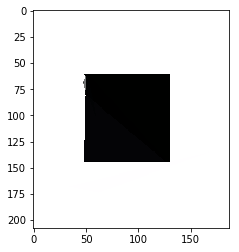

Iteration 22000
improvements 434
Fit:  0.00075070299882


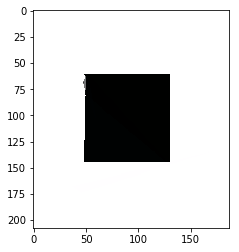

Iteration 23000
improvements 435
Fit:  0.00075060810762


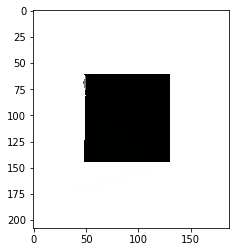

Iteration 24000
improvements 459
Fit:  0.000208829304596


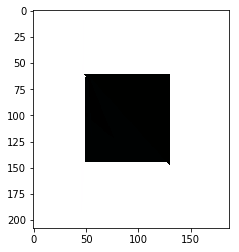

Iteration 25000
improvements 474
Fit:  0.000155783146827


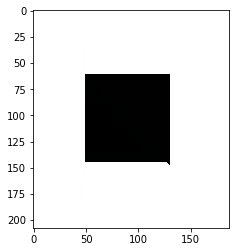

Iteration 26000
improvements 488
Fit:  0.000154864020119


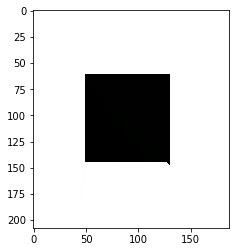

Iteration 27000
improvements 490
Fit:  0.000154571702506


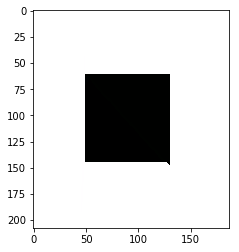

Iteration 28000
improvements 490
Fit:  0.000154571702506


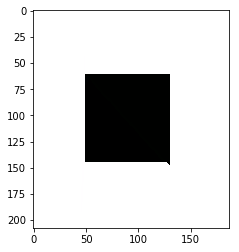

Iteration 29000
improvements 495
Fit:  0.000154520303106


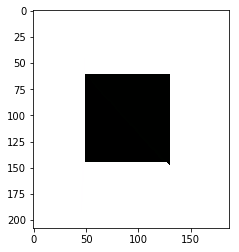

Iteration 30000
improvements 497
Fit:  0.000154395626612


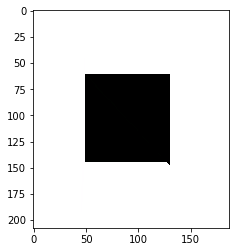

Iteration 31000
improvements 499
Fit:  0.000154314969092


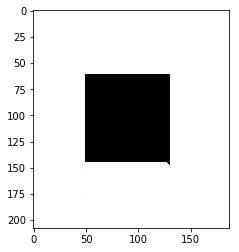

Iteration 32000
improvements 499
Fit:  0.000154314969092


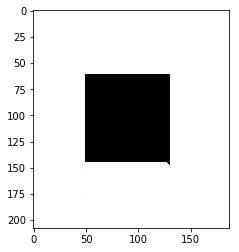

Iteration 33000
improvements 499
Fit:  0.000154314969092


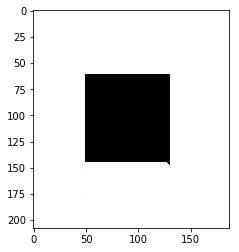

Iteration 34000
improvements 501
Fit:  0.000154298758512


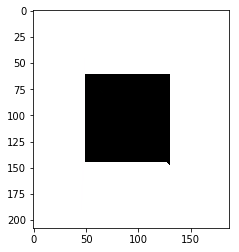

Iteration 35000
improvements 502
Fit:  1.86316235573e-06


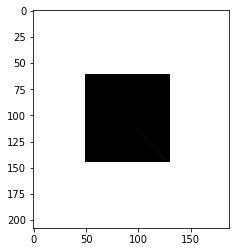

Iteration 36000
improvements 508
Fit:  7.74944800998e-07


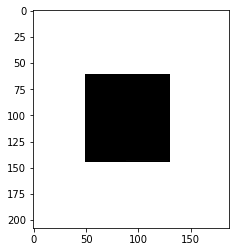

Iteration 37000
improvements 509
Fit:  2.53043200326e-07


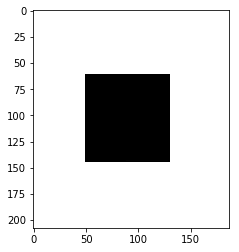

Iteration 38000
improvements 509
Fit:  2.53043200326e-07


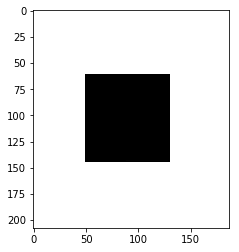

Iteration 39000
improvements 510
Fit:  0.0


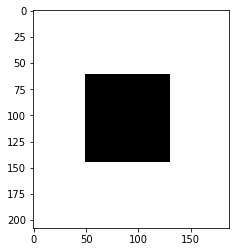

Iteration 40000
improvements 510
Fit:  0.0


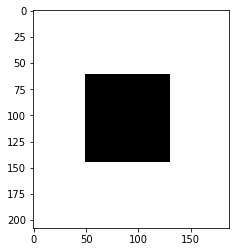

Iteration 41000
improvements 510
Fit:  0.0


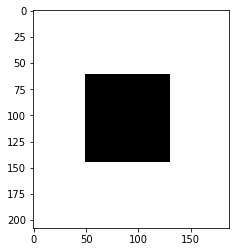

Iteration 42000
improvements 510
Fit:  0.0


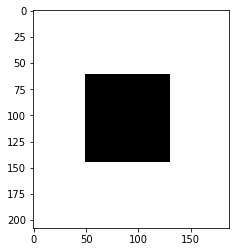

Iteration 43000
improvements 510
Fit:  0.0


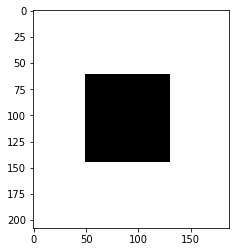

Iteration 44000
improvements 510
Fit:  0.0


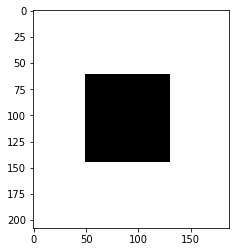

Iteration 45000
improvements 510
Fit:  0.0


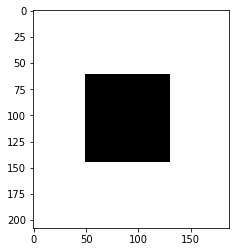

Iteration 46000
improvements 510
Fit:  0.0


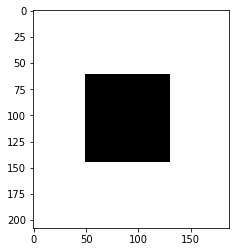

Iteration 47000
improvements 510
Fit:  0.0


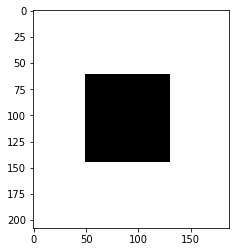

Iteration 48000
improvements 510
Fit:  0.0


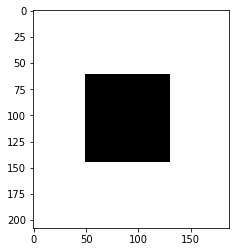

Iteration 49000
improvements 510
Fit:  0.0


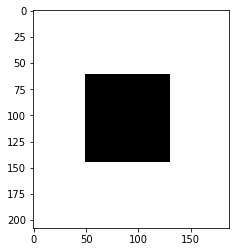

Iteration 50000
improvements 510
Fit:  0.0


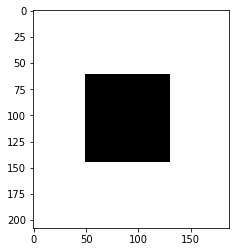

Iteration 51000
improvements 510
Fit:  0.0


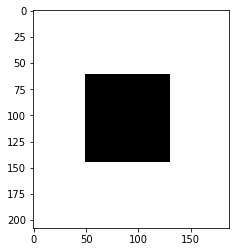

Iteration 52000
improvements 510
Fit:  0.0


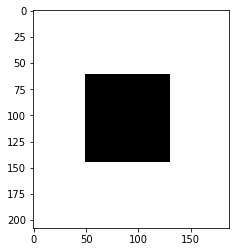

Iteration 53000
improvements 510
Fit:  0.0


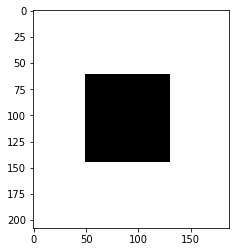

Iteration 54000
improvements 510
Fit:  0.0


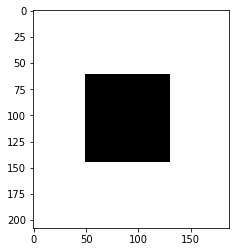

Iteration 55000
improvements 510
Fit:  0.0


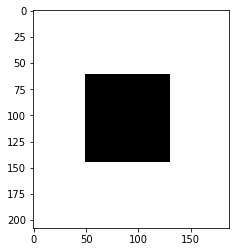

Iteration 56000
improvements 510
Fit:  0.0


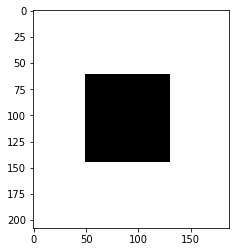

Iteration 57000
improvements 510
Fit:  0.0


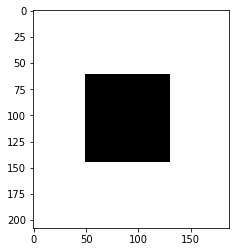

Iteration 58000
improvements 510
Fit:  0.0


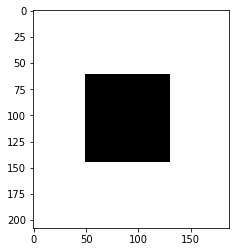

Iteration 59000
improvements 510
Fit:  0.0


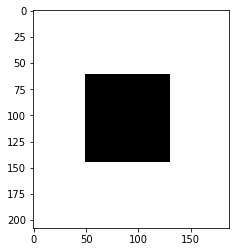

Iteration 60000
improvements 510
Fit:  0.0


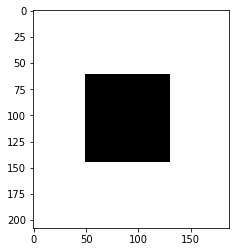

Iteration 61000
improvements 510
Fit:  0.0


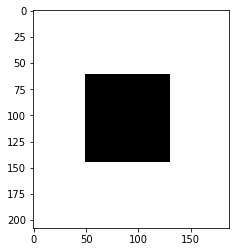

Iteration 62000
improvements 510
Fit:  0.0


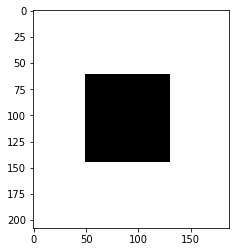

Iteration 63000
improvements 510
Fit:  0.0


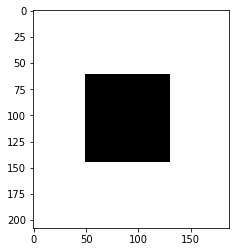

Iteration 64000
improvements 510
Fit:  0.0


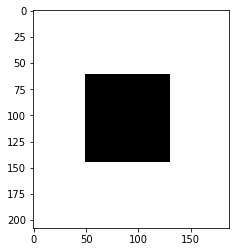

Iteration 65000
improvements 510
Fit:  0.0


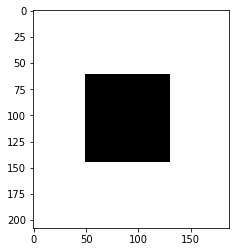

Iteration 66000
improvements 510
Fit:  0.0


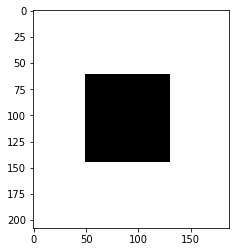

Iteration 67000
improvements 510
Fit:  0.0


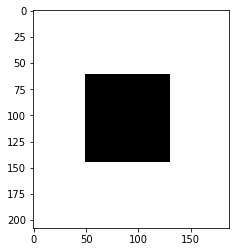

Iteration 68000
improvements 510
Fit:  0.0


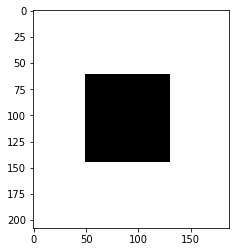

Iteration 69000
improvements 510
Fit:  0.0


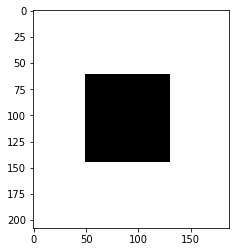

Iteration 70000
improvements 510
Fit:  0.0


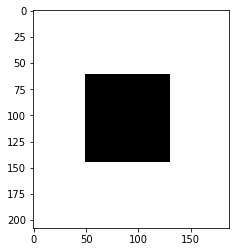

Iteration 71000
improvements 510
Fit:  0.0


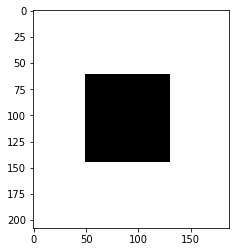

Iteration 72000
improvements 510
Fit:  0.0


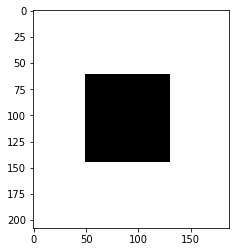

Iteration 73000
improvements 510
Fit:  0.0


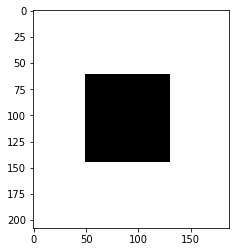

Iteration 74000
improvements 510
Fit:  0.0


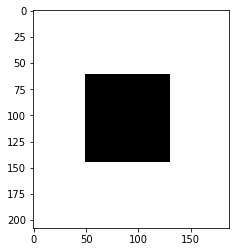

Iteration 75000
improvements 510
Fit:  0.0


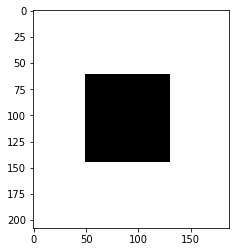

Iteration 76000
improvements 510
Fit:  0.0


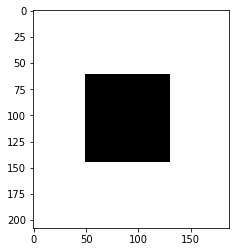

Iteration 77000
improvements 510
Fit:  0.0


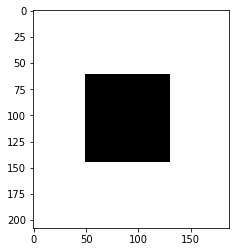

Iteration 78000
improvements 510
Fit:  0.0


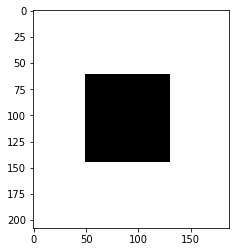

Iteration 79000
improvements 510
Fit:  0.0


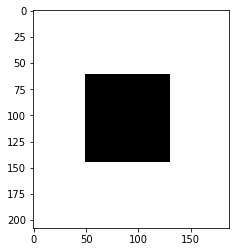

Iteration 80000
improvements 510
Fit:  0.0


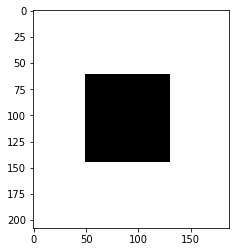

Iteration 81000
improvements 510
Fit:  0.0


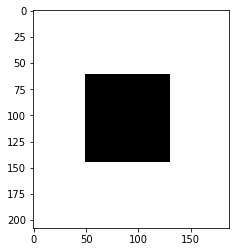

Iteration 82000
improvements 510
Fit:  0.0


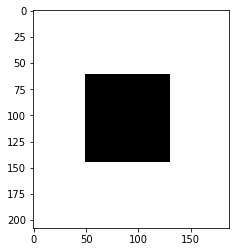

Iteration 83000
improvements 510
Fit:  0.0


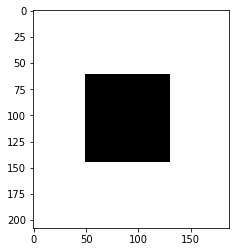

Iteration 84000
improvements 510
Fit:  0.0


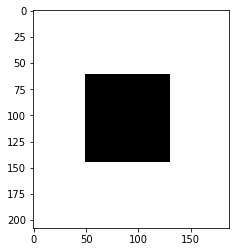

Iteration 85000
improvements 510
Fit:  0.0


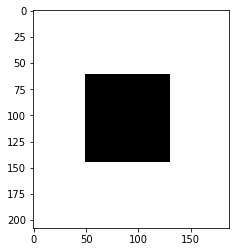

Iteration 86000
improvements 510
Fit:  0.0


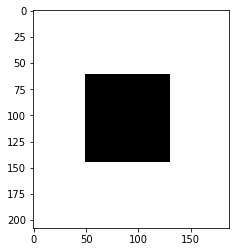

Iteration 87000
improvements 510
Fit:  0.0


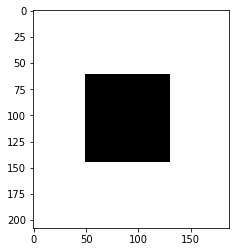

Iteration 88000
improvements 510
Fit:  0.0


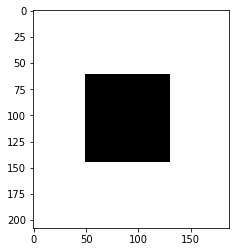

Iteration 89000
improvements 510
Fit:  0.0


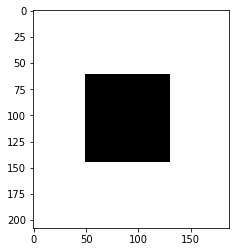

Iteration 90000
improvements 510
Fit:  0.0


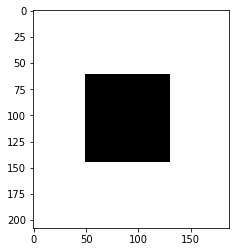

Iteration 91000
improvements 510
Fit:  0.0


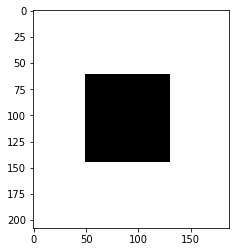

Iteration 92000
improvements 510
Fit:  0.0


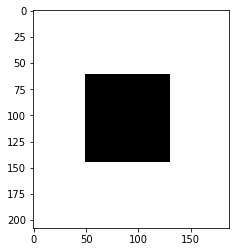

Iteration 93000
improvements 510
Fit:  0.0


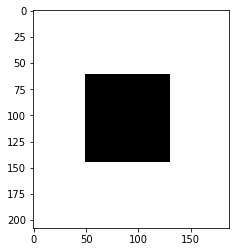

Iteration 94000
improvements 510
Fit:  0.0


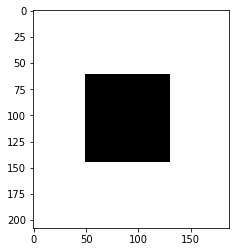

KeyboardInterrupt: 

In [290]:
hill(orig_square, 5, 3, 100000, mut_rate=0.01, mut_random=True, mut_change=-1)

Iteration 0
improvements 1
Fitness:  0.863022747582


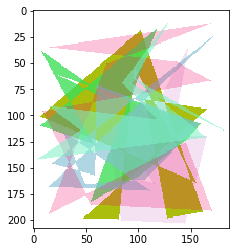

Iteration 1000
improvements 203
Fitness:  0.967841632175


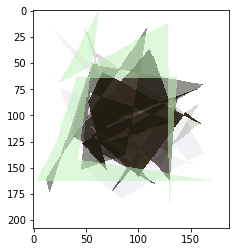

Iteration 2000
improvements 308
Fitness:  0.980604259255


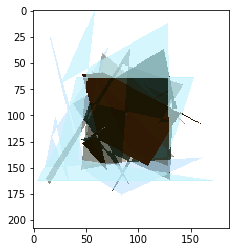

Iteration 3000
improvements 399
Fitness:  0.991653591186


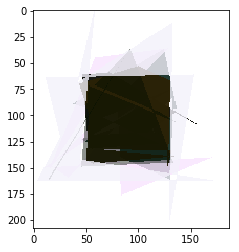

Iteration 4000
improvements 461
Fitness:  0.993870738575


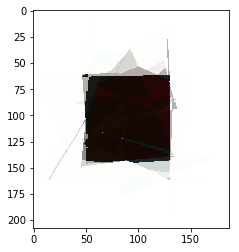

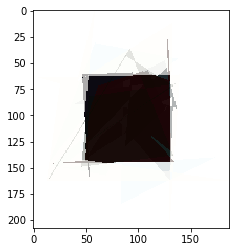

array([  9,  22,  27, 236,  46,  66, 130, 161, 133,  82,  69, 112,  51,
       140, 128,  91, 126,  96,  40,  89, 125,  48, 136,  93, 248, 253,
       254, 229,  17, 148,  69, 157,  97,  93,  25, 150, 173, 140,  84,
       184,  86,  52,  16, 143,  59,  31, 137,  46,  12,  10,  18, 255,
       106,  70,  50, 127,  53, 158,  47,  61,  94,  59,  88, 129, 125,
        94, 109,  57,  55,  82,  70,  75,  28,   4,   6, 247, 105, 113,
       131, 134, 128,  28, 130,  67, 104,  58,  62,  72,  53,  98,  50,
       143,  19, 146, 134, 144,   1,  12,   0,  80, 133,  72,  53, 124,
       135,  70,  53,  82,  46, 149, 133, 138,  92,  37,  15, 160,  15,
       160,  88,  43, 255, 254, 250, 169, 139,  61,   5,  64,  26,  70,
        13, 162, 185, 162,  44, 142,  58,   1,  42,  68, 132,  12, 130, 199])

In [33]:
hill(orig_square, 6, 10, 5000, mut_rate=0.01, mut_random=True, mut_change=-1)

Iteration 0
improvements 1
Fitness:  0.871531572833


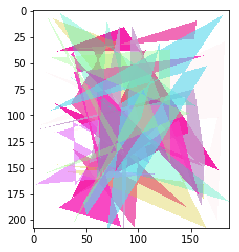

Iteration 1000
improvements 198
Fitness:  0.959297031097


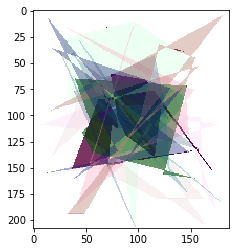

Iteration 2000
improvements 305
Fitness:  0.971567495478


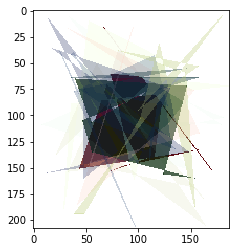

Iteration 3000
improvements 377
Fitness:  0.976746413231


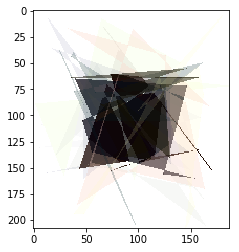

Iteration 4000
improvements 446
Fitness:  0.981227042326


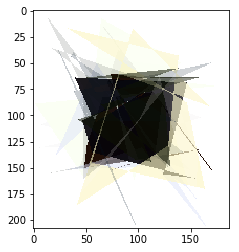

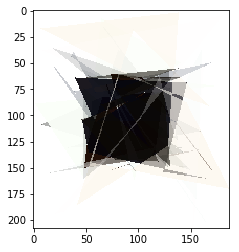

array([  5,   9,   2,  81,  73, 130, 159, 115,  52,  62, 137, 123, 128,
        54,   8, 109, 149, 152,  59,  62, 105, 109,  33, 131,  31,   9,
         1, 250,  67,  16,  84,  39,  81,  38,  44, 151, 157, 133,  87,
       148,  75, 152, 115, 139, 122,  89, 170, 152, 251, 255, 249, 241,
        73,  60, 172,  72,   2,  89,  47, 157,  65,   8, 140,  50,  74,
        88,  65,  57, 100, 143,  96, 161, 248, 252, 249, 128, 103, 130,
        79,  82, 155, 179, 160,  38, 108, 147, 170, 150,  33, 149, 115,
       131, 164, 201,  60,  51,   5,   2,   9, 232, 146,  69,  40,  64,
        59, 107, 110,  75, 104,  81,  66,  96,  47, 105,  53, 135, 164,
       160, 124, 154, 252, 246, 234, 166,  82,  60, 167,  91,  95,  18,
        42, 185, 129, 129, 138,   2,   7,  17, 146,  88, 186, 170,  54,
       145,   3,  14,  38,  54, 169,  50, 128,  69,  59,  78,  38,  40,
        36,  44, 135, 106,  55, 105,  20,  54,  97, 153,  39,  77,  13,
         8,   0, 138, 138,  55,  51,  64, 139,  64,  65,  90, 13

In [34]:
hill(orig_square, 10, 10, 5000, mut_rate=0.01, mut_random=True, mut_change=-1)

In [324]:
size = tuple(reversed(orig_mat.shape[:2]))
size

(199, 200)

In [325]:
new_img = gen_image_poly(size, np.split(dna, nr_poly))


In [29]:
def hill_voronoi(orig_img, nr_points, iter = 10, mut_rate = 0.05, mut_change = 0.05, mut_random = False):
    
    # Get params
    size = tuple(reversed(orig_img.shape[:2])) # W and H of image
    bounds_v = get_bounds_voronoi(nr_points=nr_points, size = size)
    
    # Init DNA
    dna = popul_from_bounds_voronoi(bounds=bounds_v, popsize=1)[0]  # Only one element in pop, take 1st
    dna = np.array(dna).flatten()
    #print(dna)
    
    cost_last = cost_voronoi(nr_points=nr_points, orig_mat=orig_img, params=dna)
        
    len_dna = len(dna)
    dna_last = dna
    dna_new = dna_last.copy()
    
    impr = 0
    
    for i in range(iter):    
        
        # Select randomly param to change and change it by mutation rate
        idx = randint(0, len_dna - 1)
        direction = choice([-1,1])  # Select randomly the direction
        limits = bounds[idx]  # limits 
        
        if mut_random:
            dna_new[idx] = randint(limits[0], limits[1])
        else:
            #Mutate
            dna_new[idx] = dna_last[idx] + direction*limits[1]*mut_rate
        
        # Quick limits check
        if dna_new[idx] > limits[1]:
            dna_new[idx] = limits[1]
        elif dna_new[idx] < limits[0]:
            dna_new[idx] = limits[0]
        
        # Calculate new cost
        cost_new = cost_poly(nr_poly=nr_poly, orig_mat=orig_img, params=dna_new)
        
        mut = random()
        
        # Compare costs
        if (mut < mut_change)  or (cost_new < cost_last):
            dna_last = dna_new.copy()
            cost_last = cost_new
            impr += 1
        else:
            dna_new = dna_last.copy()
            
        if i % 1000 == 0:
            print("Iteration", i)
            print("improvements", impr)
            fit = cost_last/(255*255*3*size[0]*size[1])
            print("Fit: ", fit)
            show_img(size, dna_last, nr_poly)
        
    
    show_img(size, dna_last, nr_poly)
    return dna_last

In [38]:
t = [[1,2,3],[1,2,3],[4,5,6]]